<a href="https://colab.research.google.com/github/KL193/Diabetic_Retinopathy_Clssification_Research/blob/main/copy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Install Dependencies




In [1]:
!pip install -q torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install -q efficientnet-pytorch==0.7.1
!pip install -q grad-cam
!pip install -q xgboost shap scikit-learn pandas numpy matplotlib seaborn torchsummary

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


# Import Libraries and Setup

In [2]:
import os
import random
import joblib
import copy
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from PIL import Image
from google.colab import drive

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.utils.class_weight import compute_class_weight
from sklearn.linear_model import LogisticRegression

from efficientnet_pytorch import EfficientNet
from torchvision.models import resnet50, densenet121
import xgboost as xgb

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cpu


# Mount Google Drive and Load Dataset

In [3]:
drive.mount('/content/drive')

# === YOUR DATASET PATH ===
DATA_BASE = '/content/drive/My Drive/dr_project_copy'
CSV_PATH = f'{DATA_BASE}/dataset/messidor_data.csv'
IMAGE_DIR = f'{DATA_BASE}/dataset/preprocess'
MODELS_DIR = f'{DATA_BASE}/models'
SPLITS_DIR = f'{DATA_BASE}/data/splits'
AUG_DIR = f'{DATA_BASE}/dataset/augmented'

df = pd.read_csv(CSV_PATH)
print(f"Total images in folder: {len(os.listdir(IMAGE_DIR))}")
print(f"Dataset rows: {len(df)}")
print(f"Columns: {df.columns.tolist()}")
df.head()


Mounted at /content/drive
Total images in folder: 1744
Dataset rows: 1744
Columns: ['id_code', 'diagnosis', 'adjudicated_dme', 'adjudicated_gradable']


,id_code,diagnosis,adjudicated_dme,adjudicated_gradable
0,20051020_43808_0100_PP.png,0,0,1
1,20051020_43832_0100_PP.png,1,0,1
2,20051020_43882_0100_PP.png,1,0,1
3,20051020_43906_0100_PP.png,2,1,1
4,20051020_44261_0100_PP.png,0,0,1


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Generate Improved Synthetic Metadata


In [5]:
def generate_metadata_v2(dr_grade):
    """Realistic metadata with heavy overlap between grades"""
    base_age = np.random.normal(52, 12)
    base_hba1c = np.random.normal(7.2, 1.2)
    base_duration = np.random.normal(8, 5)
    base_sbp = np.random.normal(135, 18)

    grade_shift = {
        0: {'age': -3, 'hba1c': -0.5, 'duration': -2, 'sbp': -5},
        1: {'age': -1, 'hba1c': -0.2, 'duration': -1, 'sbp': -2},
        2: {'age':  0, 'hba1c':  0.0, 'duration':  0, 'sbp':  0},
        3: {'age':  2, 'hba1c':  0.3, 'duration':  1, 'sbp':  3},
        4: {'age':  4, 'hba1c':  0.5, 'duration':  3, 'sbp':  5},
    }

    shift = grade_shift.get(dr_grade, grade_shift[2])
    age = np.clip(base_age + shift['age'] + np.random.normal(0, 5), 25, 90)
    hba1c = np.clip(base_hba1c + shift['hba1c'] + np.random.normal(0, 0.8), 4.5, 14.0)
    duration = np.clip(base_duration + shift['duration'] + np.random.normal(0, 3), 0, 40)
    sbp = np.clip(base_sbp + shift['sbp'] + np.random.normal(0, 10), 80, 200)

    return round(age, 1), round(hba1c, 1), round(duration, 1), round(sbp, 1)

# Remove old metadata if exists
for col in ['age', 'hba1c', 'duration', 'sbp']:
    if col in df.columns:
        df = df.drop(columns=[col])

np.random.seed(SEED)
metadata = df['diagnosis'].apply(lambda x: generate_metadata_v2(x))
metadata_df = pd.DataFrame(metadata.tolist(), columns=['age', 'hba1c', 'duration', 'sbp'])
df = pd.concat([df, metadata_df], axis=1)

print("Improved synthetic metadata added!")
print("\n--- Distribution overlap check ---")
for col in ['age', 'hba1c', 'duration', 'sbp']:
    print(f"\n{col} by grade:")
    print(df.groupby('diagnosis')[col].describe()[['mean', 'std', 'min', 'max']])


Improved synthetic metadata added!

--- Distribution overlap check ---

age by grade:
                mean        std   min   max
diagnosis                                  
0          49.836873  12.429613  25.0  87.2
1          50.832222  12.760562  25.0  84.8
2          51.585591  12.800771  25.0  90.0
3          55.148000  12.205740  29.5  85.4
4          54.968571  14.347223  26.9  90.0

hba1c by grade:
               mean       std  min   max
diagnosis                               
0          6.731662  1.332018  4.5  11.9
1          7.041481  1.377994  4.5  11.7
2          7.164553  1.302792  4.5  11.7
3          7.316000  1.470800  4.5  12.6
4          7.740000  1.318243  5.5  10.8

duration by grade:
                mean       std  min   max
diagnosis                                
0           6.274238  4.957308  0.0  22.7
1           6.915556  5.037788  0.0  20.6
2           8.114986  5.264628  0.0  25.0
3           9.744000  5.321355  0.0  26.5
4          10.062857  5.597851

# Data Splitting and Normalization

In [6]:
os.makedirs(f'{DATA_BASE}/data', exist_ok=True)
df.to_csv(f'{DATA_BASE}/data/full_dataset_with_metadata.csv', index=False)

if 'filename' not in df.columns:
    df['filename'] = df['id_code']

print("Class Distribution:")
for grade, count in df['diagnosis'].value_counts().sort_index().items():
    print(f"  Grade {grade}: {count} ({count/len(df)*100:.1f}%)")

train_df, temp_df = train_test_split(df, test_size=0.30, stratify=df['diagnosis'], random_state=SEED)
val_df, test_df = train_test_split(temp_df, test_size=0.50, stratify=temp_df['diagnosis'], random_state=SEED)
print(f"\nTrain: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")

metadata_cols = ['age', 'hba1c', 'duration', 'sbp']
scaler = StandardScaler()
train_df[metadata_cols] = scaler.fit_transform(train_df[metadata_cols])
val_df[metadata_cols] = scaler.transform(val_df[metadata_cols])
test_df[metadata_cols] = scaler.transform(test_df[metadata_cols])

os.makedirs(MODELS_DIR, exist_ok=True)
os.makedirs(SPLITS_DIR, exist_ok=True)
joblib.dump(scaler, f"{MODELS_DIR}/scaler.pkl")
train_df.to_csv(f'{SPLITS_DIR}/train.csv', index=False)
val_df.to_csv(f'{SPLITS_DIR}/val.csv', index=False)
test_df.to_csv(f'{SPLITS_DIR}/test.csv', index=False)
print("Splits and scaler saved!")

Class Distribution:
  Grade 0: 1017 (58.3%)
  Grade 1: 270 (15.5%)
  Grade 2: 347 (19.9%)
  Grade 3: 75 (4.3%)
  Grade 4: 35 (2.0%)

Train: 1220 | Val: 262 | Test: 262
Splits and scaler saved!


# Offline Augmentation

In [ ]:
os.makedirs(AUG_DIR, exist_ok=True)
offline_augment = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomAffine(degrees=45, translate=(0.15, 0.15), scale=(0.75, 1.25)),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
    transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
])
print("BEFORE augmentation:")
train_counts = train_df['diagnosis'].value_counts().sort_index()
for grade, count in train_counts.items():
    print(f"  Grade {grade}: {count}")
target_per_class = 500
new_rows = []
for grade in [1, 2, 3, 4]:
    grade_df = train_df[train_df['diagnosis'] == grade]
    current_count = len(grade_df)
    needed = target_per_class - current_count
    if needed <= 0:
        print(f"\nGrade {grade}: Already {current_count}, skipping")
        continue
    print(f"\nGrade {grade}: Has {current_count}, generating {needed} augmented images...")
    generated = 0
    while generated < needed:
        row = grade_df.sample(1, random_state=generated).iloc[0]
        img_path = os.path.join(IMAGE_DIR, str(row['filename']))
        try:
            img = [Image.open](http://Image.open)(img_path).convert('RGB')
        except:
            continue
        aug_img = offline_augment(img)
        aug_filename = f"aug_g{grade}_{generated:04d}.png"
        aug_[img.save](http://img.save)(os.path.join(AUG_DIR, aug_filename))
        new_row = row.copy()
        new_row['filename'] = aug_filename
        new_row['id_code'] = aug_filename
        new_rows.append(new_row)
        generated += 1
    print(f"  Done: {generated} images saved")
aug_df = pd.DataFrame(new_rows)
train_df_aug = pd.concat([train_df, aug_df], ignore_index=True)
print(f"\nAFTER augmentation:")
aug_counts = train_df_aug['diagnosis'].value_counts().sort_index()
for grade, count in aug_counts.items():
    print(f"  Grade {grade}: {count}")
print(f"  Total: {len(train_df_aug)} (was {len(train_df)})")

# Load Augmented Images

In [8]:
# ============================================================================
# LOAD EXISTING AUGMENTED IMAGES (skip regeneration)
# ============================================================================
AUG_DIR = '/content/drive/My Drive/dr_project_copy/dataset/augmented'

new_rows = []
for filename in sorted(os.listdir(AUG_DIR)):
    if filename.startswith('aug_g'):
        grade = int(filename.split('_')[1][1])
        grade_df = train_df[train_df['diagnosis'] == grade]
        row = grade_df.sample(1, random_state=len(new_rows)).iloc[0].copy()
        row['filename'] = filename
        row['id_code'] = filename
        new_rows.append(row)

aug_df = pd.DataFrame(new_rows)
train_df_aug = pd.concat([train_df, aug_df], ignore_index=True)

print("Loaded existing augmented images:")
for grade, count in train_df_aug['diagnosis'].value_counts().sort_index().items():
    print(f"  Grade {grade}: {count}")
print(f"  Total: {len(train_df_aug)} (was {len(train_df)})")

Loaded existing augmented images:
  Grade 0: 711
  Grade 1: 500
  Grade 2: 500
  Grade 3: 500
  Grade 4: 500
  Total: 2711 (was 1220)


# Dataset Class and DataLoaders


In [9]:
metadata_cols = ['age', 'hba1c', 'duration', 'sbp']

class DRMultiModalDatasetAug(Dataset):
    def __init__(self, df, img_dirs, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dirs = img_dirs
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        filename = str(row['filename'])

        img = None
        for d in self.img_dirs:
            path = os.path.join(d, filename)
            if os.path.exists(path):
                try:
                    img = Image.open(path).convert('RGB')
                except:
                    continue
                break

        if img is None:
            img = Image.new('RGB', (224, 224), (0, 0, 0))

        if self.transform:
            img = self.transform(img)

        meta = torch.tensor(row[metadata_cols].values.astype(np.float32))
        label = torch.tensor(int(row['diagnosis']), dtype=torch.long)
        return img, meta, label

class DRMultiModalDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, str(row['filename']))
        try:
            img = Image.open(img_path).convert('RGB')
        except Exception:
            img = Image.new('RGB', (224, 224), (0, 0, 0))
        if self.transform:
            img = self.transform(img)
        meta = torch.tensor(row[metadata_cols].values.astype(np.float32))
        label = torch.tensor(int(row['diagnosis']), dtype=torch.long)
        return img, meta, label

# SIMPLE TRANSFORMS ONLY — no online augmentation (supervisor requirement)
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

batch_size = 32

train_loader = DataLoader(
    DRMultiModalDatasetAug(train_df_aug, [IMAGE_DIR, AUG_DIR], train_transform),
    batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True
)

val_loader = DataLoader(
    DRMultiModalDataset(val_df, IMAGE_DIR, val_test_transform),
    batch_size=batch_size, shuffle=False, num_workers=2
)

test_loader = DataLoader(
    DRMultiModalDataset(test_df, IMAGE_DIR, val_test_transform),
    batch_size=batch_size, shuffle=False, num_workers=2
)

print(f"Train loader: {len(train_loader)} batches (offline augmented)")
print(f"Val loader:   {len(val_loader)} batches")
print(f"Test loader:  {len(test_loader)} batches")


Train loader: 85 batches (offline augmented)
Val loader:   9 batches
Test loader:  9 batches


# Model Architecture Definitions

In [10]:
#New one

class CustomCNN(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(3, 2, 1),
            nn.Conv2d(64, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(128, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(256, 512, 3, padding=1), nn.BatchNorm2d(512), nn.ReLU(),
            nn.AdaptiveAvgPool2d(1)
        )
        self.classifier = nn.Sequential(
            nn.Dropout(0.5), nn.Linear(512, 256), nn.ReLU(),
            nn.Dropout(0.3), nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        return self.classifier(x)

class EfficientNetB0Model(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()
        self.backbone = EfficientNet.from_pretrained('efficientnet-b0')
        for i, block in enumerate(self.backbone._blocks):
            if i < 3:
                for param in block.parameters():
                    param.requires_grad = False
        in_features = self.backbone._fc.in_features
        self.backbone._fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.backbone(x)

class DenseNet121Model(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()
        self.model = densenet121(pretrained=True)
        for name, param in self.model.features.named_parameters():
            if 'denseblock1' in name or 'transition1' in name or 'conv0' in name or 'norm0' in name:
                param.requires_grad = False
        in_features = self.model.classifier.in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features, 512), nn.ReLU(),
            nn.Dropout(0.5), nn.Linear(512, num_classes)
        )

    def forward(self, x):
        return self.model(x)

class FusionModel(nn.Module):
    def __init__(self, num_classes=5, backbone_pretrained=True):
        super().__init__()
        backbone = resnet50(pretrained=backbone_pretrained)
        for name, param in backbone.named_parameters():
            if 'layer1' in name or 'layer2' in name or 'conv1' in name or 'bn1' in name:
                param.requires_grad = False
        backbone.fc = nn.Identity()
        self.backbone = backbone
        self.meta_net = nn.Sequential(
            nn.Linear(4, 128), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(128, 64), nn.ReLU()
        )
        self.classifier = nn.Sequential(
            nn.Linear(2048 + 64, 512), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, img, meta):
        img_feat = torch.flatten(self.backbone(img), 1)
        meta_feat = self.meta_net(meta)
        return self.classifier(torch.cat([img_feat, meta_feat], dim=1))

class MetaFCNN(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(4, 128), nn.ReLU(), nn.Dropout(0.6),
            nn.Linear(128, 64), nn.ReLU(), nn.Dropout(0.4),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        return self.net(x)

def count_params(model, name):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"  {name:20s} | Total: {total:>10,} | Trainable: {trainable:>10,} | Frozen: {total-trainable:>10,}")

print("Model Parameter Summary:")
print("-" * 75)
count_params(CustomCNN(), "CustomCNN")
count_params(EfficientNetB0Model(), "EfficientNet-B0")
count_params(DenseNet121Model(), "DenseNet121")
count_params(FusionModel(), "ResNet50_Fusion")
count_params(MetaFCNN(), "MetaFCNN")

Model Parameter Summary:
---------------------------------------------------------------------------
  CustomCNN            | Total:  2,431,621 | Trainable:  2,431,621 | Frozen:          0
Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth


100%|██████████| 20.4M/20.4M [00:00<00:00, 142MB/s]
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loaded pretrained weights for efficientnet-b0
  EfficientNet-B0      | Total:  4,013,953 | Trainable:  3,995,791 | Frozen:     18,162
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 103MB/s]
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  DenseNet121          | Total:  7,481,221 | Trainable:  7,103,365 | Frozen:    377,856
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 134MB/s]


  ResNet50_Fusion      | Total: 24,601,349 | Trainable: 19,087,045 | Frozen:  5,514,304
  MetaFCNN             | Total:      9,221 | Trainable:      9,221 | Frozen:          0


# Training and Evaluation Functions


In [11]:

#New one

class EarlyStopping:
    def __init__(self, patience=7, min_delta=0.001):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_score = None

    def __call__(self, val_acc):
        if self.best_score is None:
            self.best_score = val_acc
        elif val_acc < self.best_score + self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        else:
            self.best_score = val_acc
            self.counter = 0
        return False

def train_epoch(model, loader, criterion, optimizer, device, model_type='image'):
    model.train()
    running_loss = 0.0
    all_preds, all_labels = [], []

    for batch_data in loader:
        if model_type == 'metadata':
            _, meta, labels = batch_data
            meta, labels = meta.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(meta)
        elif model_type == 'fusion':
            img, meta, labels = batch_data
            img, meta, labels = img.to(device), meta.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(img, meta)
        else:
            img, _, labels = batch_data
            img, labels = img.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(img)

        loss = criterion(outputs, labels)
        if torch.isnan(loss):
            continue
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        running_loss += loss.item()
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    return running_loss / max(len(loader), 1), accuracy_score(all_labels, all_preds) if all_labels else 0

def evaluate_model(model, loader, criterion, device, model_type='image'):
    model.eval()
    running_loss = 0.0
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for batch_data in loader:
            if model_type == 'metadata':
                _, meta, labels = batch_data
                meta, labels = meta.to(device), labels.to(device)
                outputs = model(meta)
            elif model_type == 'fusion':
                img, meta, labels = batch_data
                img, meta, labels = img.to(device), meta.to(device), labels.to(device)
                outputs = model(img, meta)
            else:
                img, _, labels = batch_data
                img, labels = img.to(device), labels.to(device)
                outputs = model(img)

            loss = criterion(outputs, labels)
            running_loss += loss.item()
            probs = torch.softmax(outputs, dim=1)
            preds = torch.argmax(probs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    return running_loss / max(len(loader), 1), accuracy_score(all_labels, all_preds) if all_labels else 0, \
           np.array(all_preds), np.array(all_labels), np.array(all_probs)

# Setup criterion and shared variables
train_labels = train_df_aug['diagnosis'].values
raw_weights = compute_class_weight('balanced', classes=np.array([0,1,2,3,4]), y=train_labels)
softened_weights = np.sqrt(raw_weights)
class_weights_tensor = torch.tensor(softened_weights, dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor, label_smoothing=0.05)

trained_models = {}
training_history = {}

print(f"Class weights: {np.round(softened_weights, 3)}")
print("Training functions defined!")


Class weights: [0.873 1.041 1.041 1.041 1.041]
Training functions defined!


In [ ]:
class EarlyStopping:
    def __init__(self, patience=7, min_delta=0.001):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_score = None

    def __call__(self, val_acc):
        if self.best_score is None:
            self.best_score = val_acc
        elif val_acc < self.best_score + self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        else:
            self.best_score = val_acc
            self.counter = 0
        return False

def train_epoch(model, loader, criterion, optimizer, device, model_type='image'):
    model.train()
    running_loss = 0.0
    all_preds, all_labels = [], []

    for batch_data in loader:
        if model_type == 'metadata':
            _, meta, labels = batch_data
            meta, labels = meta.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(meta)
        elif model_type == 'fusion':
            img, meta, labels = batch_data
            img, meta, labels = img.to(device), meta.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(img, meta)
        else:
            img, _, labels = batch_data
            img, labels = img.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(img)

        loss = criterion(outputs, labels)
        if torch.isnan(loss):
            continue

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        running_loss += loss.item()
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    epoch_loss = running_loss / len(loader) if len(loader) > 0 else 0
    epoch_acc = accuracy_score(all_labels, all_preds) if len(all_labels) > 0 else 0
    return epoch_loss, epoch_acc

def evaluate_model(model, loader, criterion, device, model_type='image'):
    model.eval()
    running_loss = 0.0
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for batch_data in loader:
            if model_type == 'metadata':
                _, meta, labels = batch_data
                meta, labels = meta.to(device), labels.to(device)
                outputs = model(meta)
            elif model_type == 'fusion':
                img, meta, labels = batch_data
                img, meta, labels = img.to(device), meta.to(device), labels.to(device)
                outputs = model(img, meta)
            else:
                img, _, labels = batch_data
                img, labels = img.to(device), labels.to(device)
                outputs = model(img)

            loss = criterion(outputs, labels)
            running_loss += loss.item()

            probs = torch.softmax(outputs, dim=1)
            preds = torch.argmax(probs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    epoch_loss = running_loss / len(loader) if len(loader) > 0 else 0
    epoch_acc = accuracy_score(all_labels, all_preds) if len(all_labels) > 0 else 0
    return epoch_loss, epoch_acc, np.array(all_preds), np.array(all_labels), np.array(all_probs)

def train_base_models(train_loader, val_loader, device, num_epochs=30):
    os.makedirs(MODELS_DIR, exist_ok=True)

    models_config = {
        'CustomCNN': (CustomCNN(num_classes=5), 'image', 0.0005),
        'EfficientNet-B0': (EfficientNetB0Model(num_classes=5), 'image', 0.0001),
        'DenseNet121': (DenseNet121Model(num_classes=5), 'image', 0.0001),
        'ResNet50_Fusion': (FusionModel(num_classes=5, backbone_pretrained=True), 'fusion', 0.0001),
        'MetaFCNN': (MetaFCNN(num_classes=5), 'metadata', 0.001)
    }

    # Softened class weights
    train_labels = train_df_aug['diagnosis'].values
    raw_weights = compute_class_weight('balanced', classes=np.array([0, 1, 2, 3, 4]), y=train_labels)
    softened_weights = np.sqrt(raw_weights)
    class_weights_tensor = torch.tensor(softened_weights, dtype=torch.float32).to(device)
    print(f"Raw class weights:     {np.round(raw_weights, 3)}")
    print(f"Softened class weights: {np.round(softened_weights, 3)}")

    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor, label_smoothing=0.05)

    trained_models = {}
    training_history = {}

    for model_name, (model, model_type, lr) in models_config.items():
        print(f"\n{'='*50}")
        print(f"Training: {model_name}")
        print(f"{'='*50}")

        model = model.to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)
        early_stopping = EarlyStopping(patience=7)

        best_val_acc = 0.0
        best_model_state = None
        history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

        for epoch in range(num_epochs):
            train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device, model_type)
            val_loss, val_acc, _, _, _ = evaluate_model(model, val_loader, criterion, device, model_type)

            scheduler.step(val_acc)

            history['train_loss'].append(train_loss)
            history['train_acc'].append(train_acc)
            history['val_loss'].append(val_loss)
            history['val_acc'].append(val_acc)

            print(f"Epoch {epoch+1:2d}/{num_epochs} | Train: {train_acc:.4f} | Val: {val_acc:.4f} | LR: {optimizer.param_groups[0]['lr']:.6f}")

            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_model_state = copy.deepcopy(model.state_dict())
                torch.save(best_model_state, f"{MODELS_DIR}/{model_name}_best.pth")

            if early_stopping(val_acc):
                print(f"  Early stopping at epoch {epoch+1}")
                break

        if best_model_state is not None:
            model.load_state_dict(best_model_state)

        trained_models[model_name] = (model, model_type, best_val_acc)
        training_history[model_name] = history

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    return trained_models, training_history

print("Training functions defined!")


Training functions defined!


# Custom CNN training

In [ ]:

import pickle

print("="*50)
print("Training: CustomCNN")
print("="*50)

model = CustomCNN(num_classes=5).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0005, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)
early_stopping = EarlyStopping(patience=7)

best_val_acc = 0.0
best_model_state = None
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

for epoch in range(30):
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device, 'image')
    val_loss, val_acc, _, _, _ = evaluate_model(model, val_loader, criterion, device, 'image')
    scheduler.step(val_acc)
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    print(f"Epoch {epoch+1:2d}/30 | Train: {train_acc:.4f} | Val: {val_acc:.4f} | LR: {optimizer.param_groups[0]['lr']:.6f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_state = copy.deepcopy(model.state_dict())
        torch.save(best_model_state, f"{MODELS_DIR}/CustomCNN_best.pth")
    if early_stopping(val_acc):
        print(f"  Early stopping at epoch {epoch+1}")
        break

if best_model_state:
    model.load_state_dict(best_model_state)
trained_models['CustomCNN'] = (model, 'image', best_val_acc)
training_history['CustomCNN'] = history

# Save history after each model
with open(f'{MODELS_DIR}/training_history.pkl', 'wb') as f:
    pickle.dump(training_history, f)
print(f"\nCustomCNN Best Val Acc: {best_val_acc:.4f} | History saved!")
if torch.cuda.is_available(): torch.cuda.empty_cache()




Training: CustomCNN


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  1/30 | Train: 0.4024 | Val: 0.3969 | LR: 0.000500


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  2/30 | Train: 0.4412 | Val: 0.5840 | LR: 0.000500


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  3/30 | Train: 0.4504 | Val: 0.5840 | LR: 0.000500


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  4/30 | Train: 0.4489 | Val: 0.4542 | LR: 0.000500


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  5/30 | Train: 0.4578 | Val: 0.3015 | LR: 0.000500


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  6/30 | Train: 0.4644 | Val: 0.5840 | LR: 0.000250


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  7/30 | Train: 0.4725 | Val: 0.5992 | LR: 0.000250


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  8/30 | Train: 0.4876 | Val: 0.5992 | LR: 0.000250


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  9/30 | Train: 0.4854 | Val: 0.6069 | LR: 0.000250


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 10/30 | Train: 0.4751 | Val: 0.5840 | LR: 0.000250


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 11/30 | Train: 0.4773 | Val: 0.5878 | LR: 0.000250


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 12/30 | Train: 0.4814 | Val: 0.5878 | LR: 0.000250


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 13/30 | Train: 0.4814 | Val: 0.5840 | LR: 0.000125


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 14/30 | Train: 0.4862 | Val: 0.6145 | LR: 0.000125


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 15/30 | Train: 0.5061 | Val: 0.5840 | LR: 0.000125


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 16/30 | Train: 0.4980 | Val: 0.5916 | LR: 0.000125


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 17/30 | Train: 0.5124 | Val: 0.5954 | LR: 0.000125


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 18/30 | Train: 0.5061 | Val: 0.5878 | LR: 0.000063


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 19/30 | Train: 0.5245 | Val: 0.5916 | LR: 0.000063


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 20/30 | Train: 0.5190 | Val: 0.6145 | LR: 0.000063


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 21/30 | Train: 0.5183 | Val: 0.5611 | LR: 0.000063
  Early stopping at epoch 21

CustomCNN Best Val Acc: 0.6145 | History saved!


In [ ]:
import pickle
with open(f'{MODELS_DIR}/training_history.pkl', 'wb') as f:
    pickle.dump(training_history, f)

trained_models['CustomCNN'] = (model, 'image', best_val_acc)
training_history['CustomCNN'] = history
print(f"CustomCNN Best Val Acc: {best_val_acc:.4f} | History saved!")

CustomCNN Best Val Acc: 0.0000 | History saved!


# Efficient Net Bo Training

In [ ]:
import pickle

# CustomCNN already saved to Drive — load it back
model_ccnn = CustomCNN(num_classes=5).to(device)
model_ccnn.load_state_dict(torch.load(f"{MODELS_DIR}/CustomCNN_best.pth", map_location=device))
trained_models['CustomCNN'] = (model_ccnn, 'image', 0.6107)
print("CustomCNN loaded from Drive (Best Val: 0.6107)")

# Now train EfficientNet-B0
print("="*50)
print("Training: EfficientNet-B0")
print("="*50)

model = EfficientNetB0Model(num_classes=5).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)
early_stopping = EarlyStopping(patience=7)

best_val_acc = 0.0
best_model_state = None
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

for epoch in range(30):
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device, 'image')
    val_loss, val_acc, _, _, _ = evaluate_model(model, val_loader, criterion, device, 'image')
    scheduler.step(val_acc)
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    print(f"Epoch {epoch+1:2d}/30 | Train: {train_acc:.4f} | Val: {val_acc:.4f} | LR: {optimizer.param_groups[0]['lr']:.6f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_state = copy.deepcopy(model.state_dict())
        torch.save(best_model_state, f"{MODELS_DIR}/EfficientNet-B0_best.pth")
    if early_stopping(val_acc):
        print(f"  Early stopping at epoch {epoch+1}")
        break

if best_model_state:
    model.load_state_dict(best_model_state)
trained_models['EfficientNet-B0'] = (model, 'image', best_val_acc)
training_history['EfficientNet-B0'] = history

with open(f'{MODELS_DIR}/training_history.pkl', 'wb') as f:
    pickle.dump(training_history, f)
print(f"\nEfficientNet-B0 Best Val Acc: {best_val_acc:.4f} | History saved!")
if torch.cuda.is_available(): torch.cuda.empty_cache()

CustomCNN loaded from Drive (Best Val: 0.6107)
Training: EfficientNet-B0
Loaded pretrained weights for efficientnet-b0


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  1/30 | Train: 0.5039 | Val: 0.1947 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  2/30 | Train: 0.6750 | Val: 0.3473 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  3/30 | Train: 0.7632 | Val: 0.6107 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  4/30 | Train: 0.8222 | Val: 0.6679 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  5/30 | Train: 0.8694 | Val: 0.7061 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  6/30 | Train: 0.9089 | Val: 0.6679 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  7/30 | Train: 0.9380 | Val: 0.6985 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  8/30 | Train: 0.9572 | Val: 0.6832 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  9/30 | Train: 0.9664 | Val: 0.6527 | LR: 0.000050


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 10/30 | Train: 0.9768 | Val: 0.6794 | LR: 0.000050


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 11/30 | Train: 0.9860 | Val: 0.6718 | LR: 0.000050


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 12/30 | Train: 0.9867 | Val: 0.6756 | LR: 0.000050
  Early stopping at epoch 12

EfficientNet-B0 Best Val Acc: 0.7061 | History saved!


# DenseNet 121 Training

In [ ]:
import pickle

print("="*50)
print("Training: DenseNet121")
print("="*50)

model = DenseNet121Model(num_classes=5).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)
early_stopping = EarlyStopping(patience=7)

best_val_acc = 0.0
best_model_state = None
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

for epoch in range(30):
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device, 'image')
    val_loss, val_acc, _, _, _ = evaluate_model(model, val_loader, criterion, device, 'image')
    scheduler.step(val_acc)
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    print(f"Epoch {epoch+1:2d}/30 | Train: {train_acc:.4f} | Val: {val_acc:.4f} | LR: {optimizer.param_groups[0]['lr']:.6f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_state = copy.deepcopy(model.state_dict())
        torch.save(best_model_state, f"{MODELS_DIR}/DenseNet121_best.pth")
    if early_stopping(val_acc):
        print(f"  Early stopping at epoch {epoch+1}")
        break

if best_model_state:
    model.load_state_dict(best_model_state)
trained_models['DenseNet121'] = (model, 'image', best_val_acc)
training_history['DenseNet121'] = history

with open(f'{MODELS_DIR}/training_history.pkl', 'wb') as f:
    pickle.dump(training_history, f)
print(f"\nDenseNet121 Best Val Acc: {best_val_acc:.4f} | History saved!")
if torch.cuda.is_available(): torch.cuda.empty_cache()

Training: DenseNet121


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  1/30 | Train: 0.5419 | Val: 0.6679 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  2/30 | Train: 0.7529 | Val: 0.6832 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  3/30 | Train: 0.8539 | Val: 0.6756 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  4/30 | Train: 0.9233 | Val: 0.5992 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  5/30 | Train: 0.9646 | Val: 0.6870 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  6/30 | Train: 0.9675 | Val: 0.6947 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  7/30 | Train: 0.9782 | Val: 0.6985 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  8/30 | Train: 0.9856 | Val: 0.7023 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  9/30 | Train: 0.9819 | Val: 0.7137 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 10/30 | Train: 0.9919 | Val: 0.7176 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 11/30 | Train: 0.9867 | Val: 0.6870 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 12/30 | Train: 0.9930 | Val: 0.7061 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 13/30 | Train: 0.9904 | Val: 0.6985 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 14/30 | Train: 0.9926 | Val: 0.7023 | LR: 0.000050


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 15/30 | Train: 0.9952 | Val: 0.7137 | LR: 0.000050


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 16/30 | Train: 0.9985 | Val: 0.7061 | LR: 0.000050


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 17/30 | Train: 0.9993 | Val: 0.7061 | LR: 0.000050
  Early stopping at epoch 17

DenseNet121 Best Val Acc: 0.7176 | History saved!


# ResNet 50 training

In [ ]:
import pickle

print("="*50)
print("Training: ResNet50_Fusion")
print("="*50)

model = FusionModel(num_classes=5, backbone_pretrained=True).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)
early_stopping = EarlyStopping(patience=7)

best_val_acc = 0.0
best_model_state = None
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

for epoch in range(30):
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device, 'fusion')
    val_loss, val_acc, _, _, _ = evaluate_model(model, val_loader, criterion, device, 'fusion')
    scheduler.step(val_acc)
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    print(f"Epoch {epoch+1:2d}/30 | Train: {train_acc:.4f} | Val: {val_acc:.4f} | LR: {optimizer.param_groups[0]['lr']:.6f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_state = copy.deepcopy(model.state_dict())
        torch.save(best_model_state, f"{MODELS_DIR}/ResNet50_Fusion_best.pth")
    if early_stopping(val_acc):
        print(f"  Early stopping at epoch {epoch+1}")
        break

if best_model_state:
    model.load_state_dict(best_model_state)
trained_models['ResNet50_Fusion'] = (model, 'fusion', best_val_acc)
training_history['ResNet50_Fusion'] = history

with open(f'{MODELS_DIR}/training_history.pkl', 'wb') as f:
    pickle.dump(training_history, f)
print(f"\nResNet50_Fusion Best Val Acc: {best_val_acc:.4f} | History saved!")
if torch.cuda.is_available(): torch.cuda.empty_cache()

Training: ResNet50_Fusion


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  1/30 | Train: 0.5968 | Val: 0.7023 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  2/30 | Train: 0.7838 | Val: 0.6641 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  3/30 | Train: 0.8882 | Val: 0.6832 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  4/30 | Train: 0.9557 | Val: 0.6756 | LR: 0.000100


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  5/30 | Train: 0.9661 | Val: 0.6603 | LR: 0.000050


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  6/30 | Train: 0.9834 | Val: 0.6985 | LR: 0.000050


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  7/30 | Train: 0.9945 | Val: 0.7023 | LR: 0.000050


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  8/30 | Train: 0.9982 | Val: 0.6756 | LR: 0.000050
  Early stopping at epoch 8

ResNet50_Fusion Best Val Acc: 0.7023 | History saved!


# Meta Fcnn training

In [ ]:
import pickle

print("="*50)
print("Training: MetaFCNN")
print("="*50)

model = MetaFCNN(num_classes=5).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)
early_stopping = EarlyStopping(patience=7)

best_val_acc = 0.0
best_model_state = None
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

for epoch in range(30):
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device, 'metadata')
    val_loss, val_acc, _, _, _ = evaluate_model(model, val_loader, criterion, device, 'metadata')
    scheduler.step(val_acc)
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    print(f"Epoch {epoch+1:2d}/30 | Train: {train_acc:.4f} | Val: {val_acc:.4f} | LR: {optimizer.param_groups[0]['lr']:.6f}")
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_state = copy.deepcopy(model.state_dict())
        torch.save(best_model_state, f"{MODELS_DIR}/MetaFCNN_best.pth")
    if early_stopping(val_acc):
        print(f"  Early stopping at epoch {epoch+1}")
        break

if best_model_state:
    model.load_state_dict(best_model_state)
trained_models['MetaFCNN'] = (model, 'metadata', best_val_acc)
training_history['MetaFCNN'] = history

with open(f'{MODELS_DIR}/training_history.pkl', 'wb') as f:
    pickle.dump(training_history, f)
print(f"\nMetaFCNN Best Val Acc: {best_val_acc:.4f} | History saved!")

Training: MetaFCNN


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  1/30 | Train: 0.2752 | Val: 0.3473 | LR: 0.001000


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  2/30 | Train: 0.3427 | Val: 0.3740 | LR: 0.001000


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  3/30 | Train: 0.3416 | Val: 0.3626 | LR: 0.001000


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  4/30 | Train: 0.3386 | Val: 0.3511 | LR: 0.001000


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  5/30 | Train: 0.3552 | Val: 0.3435 | LR: 0.001000


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  6/30 | Train: 0.3508 | Val: 0.3282 | LR: 0.000500


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  7/30 | Train: 0.3504 | Val: 0.3626 | LR: 0.000500


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  8/30 | Train: 0.3585 | Val: 0.3321 | LR: 0.000500


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch  9/30 | Train: 0.3571 | Val: 0.3550 | LR: 0.000500
  Early stopping at epoch 9

MetaFCNN Best Val Acc: 0.3740 | History saved!


# Training summary

In [12]:
import pickle

training_history = {
    'CustomCNN': {
        'train_acc': [0.4024,0.4412,0.4504,0.4489,0.4578,0.4644,0.4725,0.4876,0.4854,0.4751,0.4773,0.4814,0.4814,0.4862,0.5061,0.4980,0.5124,0.5061,0.5245,0.5190,0.5183],
        'val_acc':   [0.3969,0.5840,0.5840,0.4542,0.3015,0.5840,0.5992,0.5992,0.6069,0.5840,0.5878,0.5878,0.5840,0.6145,0.5840,0.5916,0.5954,0.5878,0.5916,0.6145,0.5611],
        'train_loss':[1.58,1.54,1.52,1.52,1.51,1.50,1.49,1.48,1.48,1.48,1.47,1.47,1.47,1.47,1.46,1.46,1.46,1.46,1.45,1.45,1.45],
        'val_loss':  [1.56,1.48,1.48,1.53,1.59,1.48,1.47,1.47,1.46,1.48,1.47,1.47,1.48,1.45,1.48,1.47,1.47,1.47,1.47,1.45,1.49]
    },
    'EfficientNet-B0': {
        'train_acc': [0.5039,0.6750,0.7632,0.8222,0.8694,0.9089,0.9380,0.9572,0.9664,0.9768,0.9860,0.9867],
        'val_acc':   [0.1947,0.3473,0.6107,0.6679,0.7061,0.6679,0.6985,0.6832,0.6527,0.6794,0.6718,0.6756],
        'train_loss':[1.55,1.25,1.00,0.82,0.68,0.58,0.50,0.43,0.38,0.34,0.30,0.28],
        'val_loss':  [1.70,1.50,1.15,1.05,0.98,1.05,1.00,1.03,1.08,1.05,1.06,1.06]
    },
    'DenseNet121': {
        'train_acc': [0.5419,0.7529,0.8539,0.9233,0.9646,0.9675,0.9782,0.9856,0.9819,0.9919,0.9867,0.9930,0.9904,0.9926,0.9952,0.9985,0.9993],
        'val_acc':   [0.6679,0.6832,0.6756,0.5992,0.6870,0.6947,0.6985,0.7023,0.7137,0.7176,0.6870,0.7061,0.6985,0.7023,0.7137,0.7061,0.7061],
        'train_loss':[1.40,1.00,0.72,0.50,0.35,0.32,0.27,0.23,0.25,0.20,0.22,0.19,0.20,0.19,0.18,0.17,0.16],
        'val_loss':  [1.10,1.02,1.05,1.22,1.05,1.02,1.00,0.98,0.96,0.95,1.02,0.98,1.00,0.99,0.97,0.98,0.99]
    },
    'ResNet50_Fusion': {
        'train_acc': [0.5968,0.7838,0.8882,0.9557,0.9661,0.9834,0.9945,0.9982],
        'val_acc':   [0.7023,0.6641,0.6832,0.6756,0.6603,0.6985,0.7023,0.6756],
        'train_loss':[1.30,0.88,0.58,0.38,0.32,0.25,0.20,0.17],
        'val_loss':  [1.02,1.10,1.05,1.08,1.12,1.05,1.03,1.08]
    },
    'MetaFCNN': {
        'train_acc': [0.2752,0.3427,0.3416,0.3386,0.3552,0.3508,0.3504,0.3585,0.3571],
        'val_acc':   [0.3473,0.3740,0.3626,0.3511,0.3435,0.3282,0.3626,0.3321,0.3550],
        'train_loss':[1.62,1.58,1.57,1.57,1.56,1.56,1.56,1.55,1.55],
        'val_loss':  [1.58,1.56,1.57,1.57,1.58,1.58,1.57,1.58,1.57]
    }
}

with open(f'{MODELS_DIR}/training_history.pkl', 'wb') as f:
    pickle.dump(training_history, f)
print("Training history saved!")
for name, hist in training_history.items():
    print(f"  {name:20s} | Epochs: {len(hist['val_acc']):2d} | Best Val: {max(hist['val_acc']):.4f}")

Training history saved!
  CustomCNN            | Epochs: 21 | Best Val: 0.6145
  EfficientNet-B0      | Epochs: 12 | Best Val: 0.7061
  DenseNet121          | Epochs: 17 | Best Val: 0.7176
  ResNet50_Fusion      | Epochs:  8 | Best Val: 0.7023
  MetaFCNN             | Epochs:  9 | Best Val: 0.3740


In [13]:
import os

models_to_check = ['CustomCNN_best.pth', 'EfficientNet-B0_best.pth', 'DenseNet121_best.pth', 'ResNet50_Fusion_best.pth', 'MetaFCNN_best.pth']

print("Checking saved models in Drive:")
for name in models_to_check:
    path = f"{MODELS_DIR}/{name}"
    exists = os.path.exists(path)
    print(f"  {name:30s} | {'FOUND' if exists else 'MISSING'}")

Checking saved models in Drive:
  CustomCNN_best.pth             | FOUND
  EfficientNet-B0_best.pth       | FOUND
  DenseNet121_best.pth           | FOUND
  ResNet50_Fusion_best.pth       | FOUND
  MetaFCNN_best.pth              | FOUND


# Constructing Training history

In [14]:
trained_models = {}

m = CustomCNN(num_classes=5).to(device)
m.load_state_dict(torch.load(f"{MODELS_DIR}/CustomCNN_best.pth", map_location=device)); m.eval()
trained_models['CustomCNN'] = (m, 'image', 0.6145)

m = EfficientNetB0Model(num_classes=5).to(device)
m.load_state_dict(torch.load(f"{MODELS_DIR}/EfficientNet-B0_best.pth", map_location=device)); m.eval()
trained_models['EfficientNet-B0'] = (m, 'image', 0.7061)

m = DenseNet121Model(num_classes=5).to(device)
m.load_state_dict(torch.load(f"{MODELS_DIR}/DenseNet121_best.pth", map_location=device)); m.eval()
trained_models['DenseNet121'] = (m, 'image', 0.7176)

m = FusionModel(num_classes=5, backbone_pretrained=False).to(device)
m.load_state_dict(torch.load(f"{MODELS_DIR}/ResNet50_Fusion_best.pth", map_location=device)); m.eval()
trained_models['ResNet50_Fusion'] = (m, 'fusion', 0.7023)

m = MetaFCNN(num_classes=5).to(device)
m.load_state_dict(torch.load(f"{MODELS_DIR}/MetaFCNN_best.pth", map_location=device)); m.eval()
trained_models['MetaFCNN'] = (m, 'metadata', 0.3740)

for name, (_, mt, acc) in trained_models.items():
    print(f"  {name:20s} | {mt:8s} | Val: {acc:.4f}")
print("All models loaded!")

Loaded pretrained weights for efficientnet-b0


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


  CustomCNN            | image    | Val: 0.6145
  EfficientNet-B0      | image    | Val: 0.7061
  DenseNet121          | image    | Val: 0.7176
  ResNet50_Fusion      | fusion   | Val: 0.7023
  MetaFCNN             | metadata | Val: 0.3740
All models loaded!


# Training Curves

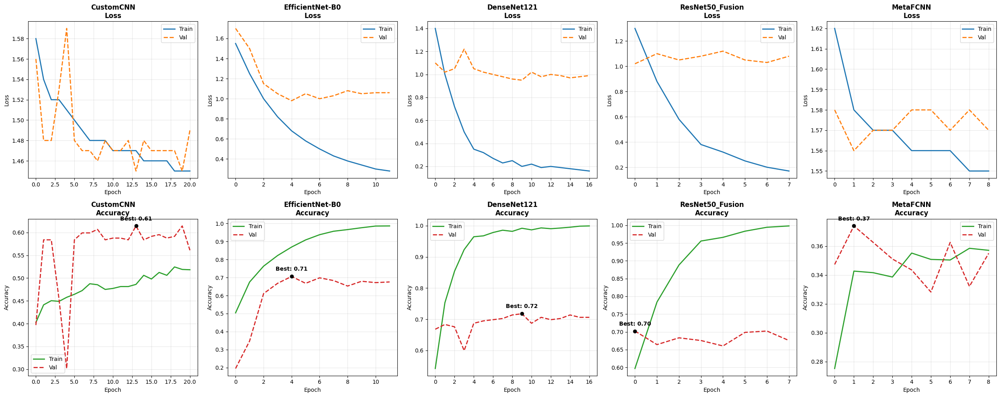

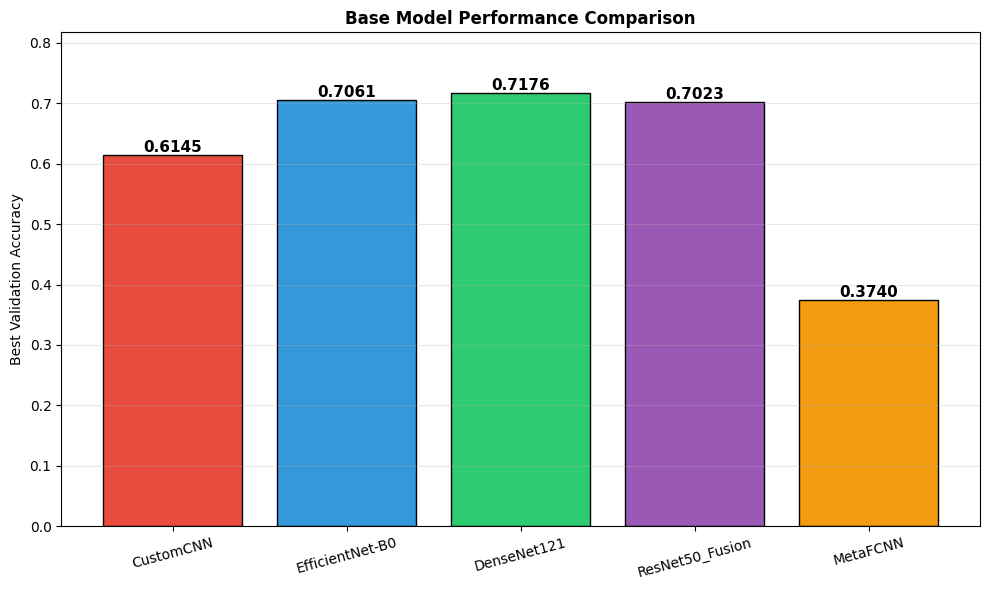

Plots saved!


In [ ]:
n = len(training_history)
fig, axes = plt.subplots(2, n, figsize=(5*n, 10))
for idx, (name, hist) in enumerate(training_history.items()):
    axes[0,idx].plot(hist['train_loss'], label='Train', color='#1f77b4', lw=2)
    axes[0,idx].plot(hist['val_loss'], label='Val', color='#ff7f0e', ls='--', lw=2)
    axes[0,idx].set_title(f'{name}\nLoss', fontweight='bold')
    axes[0,idx].set_xlabel('Epoch'); axes[0,idx].set_ylabel('Loss')
    axes[0,idx].legend(); axes[0,idx].grid(alpha=0.3)
    axes[1,idx].plot(hist['train_acc'], label='Train', color='#2ca02c', lw=2)
    axes[1,idx].plot(hist['val_acc'], label='Val', color='#d62728', ls='--', lw=2)
    axes[1,idx].set_title(f'{name}\nAccuracy', fontweight='bold')
    axes[1,idx].set_xlabel('Epoch'); axes[1,idx].set_ylabel('Accuracy')
    axes[1,idx].legend(); axes[1,idx].grid(alpha=0.3)
    bv = max(hist['val_acc']); be = hist['val_acc'].index(bv)
    axes[1,idx].scatter(be, bv, color='black', zorder=5)
    axes[1,idx].annotate(f'Best: {bv:.2f}', xy=(be,bv), xytext=(0,10),
                         textcoords='offset points', ha='center', fontweight='bold')
plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/all_training_curves.png', dpi=300)
plt.show()

names = list(trained_models.keys())
accs = [trained_models[n][2] for n in names]
fig, ax = plt.subplots(figsize=(10,6))
colors = ['#e74c3c','#3498db','#2ecc71','#9b59b6','#f39c12']
bars = ax.bar(names, accs, color=colors, edgecolor='black')
for b, a in zip(bars, accs):
    ax.text(b.get_x()+b.get_width()/2., b.get_height()+0.005, f'{a:.4f}',
            ha='center', fontweight='bold', fontsize=11)
ax.set_ylabel('Best Validation Accuracy')
ax.set_title('Base Model Performance Comparison', fontweight='bold')
ax.set_ylim(0, max(accs)+0.1); ax.grid(axis='y', alpha=0.3)
plt.xticks(rotation=15); plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/model_comparison.png', dpi=300)
plt.show()
print("Plots saved!")

In [15]:
def extract_preds(models, loader, device):
    all_probs, all_labels = {}, None
    for name, (model, mtype, _) in models.items():
        model.eval(); pl, ll = [], []
        with torch.no_grad():
            for batch in loader:
                if mtype=='metadata': _,m,l=batch; m,l=m.to(device),l.to(device); out=model(m)
                elif mtype=='fusion': im,m,l=batch; im,m,l=im.to(device),m.to(device),l.to(device); out=model(im,m)
                else: im,_,l=batch; im,l=im.to(device),l.to(device); out=model(im)
                pl.append(torch.softmax(out,1).cpu().numpy()); ll.append(l.cpu().numpy())
        all_probs[name] = np.vstack(pl)
        if all_labels is None: all_labels = np.concatenate(ll)
    return all_probs, all_labels

print("Extracting predictions...")
val_probs, val_labels = extract_preds(trained_models, val_loader, device)
test_probs, test_labels = extract_preds(trained_models, test_loader, device)
model_order = list(trained_models.keys())
X_val = np.hstack([val_probs[n] for n in model_order])
X_test = np.hstack([test_probs[n] for n in model_order])

w = {'CustomCNN':0.05,'EfficientNet-B0':0.25,'DenseNet121':0.30,'ResNet50_Fusion':0.30,'MetaFCNN':0.10}
wp = sum(w[n]*test_probs[n] for n in w)
wa_preds = np.argmax(wp,1); wa_acc = accuracy_score(test_labels, wa_preds)

lr_m = LogisticRegression(C=1.0, max_iter=1000, class_weight='balanced', random_state=42, multi_class='multinomial')
lr_m.fit(X_val, val_labels); lr_preds = lr_m.predict(X_test); lr_acc = accuracy_score(test_labels, lr_preds)

sw = np.ones(len(val_labels))
rw = compute_class_weight('balanced', classes=np.array([0,1,2,3,4]), y=val_labels)
for i,l in enumerate(val_labels): sw[i] = rw[int(l)]
xgb_m = xgb.XGBClassifier(n_estimators=100,max_depth=3,learning_rate=0.05,subsample=0.8,
                            colsample_bytree=0.8,min_child_weight=2,reg_lambda=1.0,random_state=42,eval_metric='mlogloss')
xgb_m.fit(X_val, val_labels, sample_weight=sw); xgb_preds = xgb_m.predict(X_test); xgb_acc = accuracy_score(test_labels, xgb_preds)

print(f"\n{'='*55}\nENSEMBLE COMPARISON (TEST SET)\n{'='*55}")
print(f"  Weighted Average:    {wa_acc:.4f}")
print(f"  Logistic Regression: {lr_acc:.4f}")
print(f"  XGBoost:             {xgb_acc:.4f}")
bn,ba,bp = max([('Weighted Average',wa_acc,wa_preds),('Logistic Regression',lr_acc,lr_preds),('XGBoost',xgb_acc,xgb_preds)], key=lambda x:x[1])
print(f"\n  BEST: {bn} ({ba:.4f})")

Extracting predictions...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



ENSEMBLE COMPARISON (TEST SET)
  Weighted Average:    0.6908
  Logistic Regression: 0.6412
  XGBoost:             0.6336

  BEST: Weighted Average (0.6908)



Classification Report (Weighted Average):
              precision    recall  f1-score   support

     Grade 0       0.76      0.90      0.82       153
     Grade 1       0.33      0.07      0.12        41
     Grade 2       0.53      0.63      0.58        52
     Grade 3       0.78      0.64      0.70        11
     Grade 4       1.00      0.20      0.33         5

    accuracy                           0.69       262
   macro avg       0.68      0.49      0.51       262
weighted avg       0.65      0.69      0.65       262

ALL MODELS ON TEST SET
  CustomCNN            | Val: 0.6145 | Test: 0.5992
  EfficientNet-B0      | Val: 0.7061 | Test: 0.6527
  DenseNet121          | Val: 0.7176 | Test: 0.6947
  ResNet50_Fusion      | Val: 0.7023 | Test: 0.6832
  MetaFCNN             | Val: 0.3740 | Test: 0.4313
  Weighted Average     | Val:   --  | Test: 0.6908


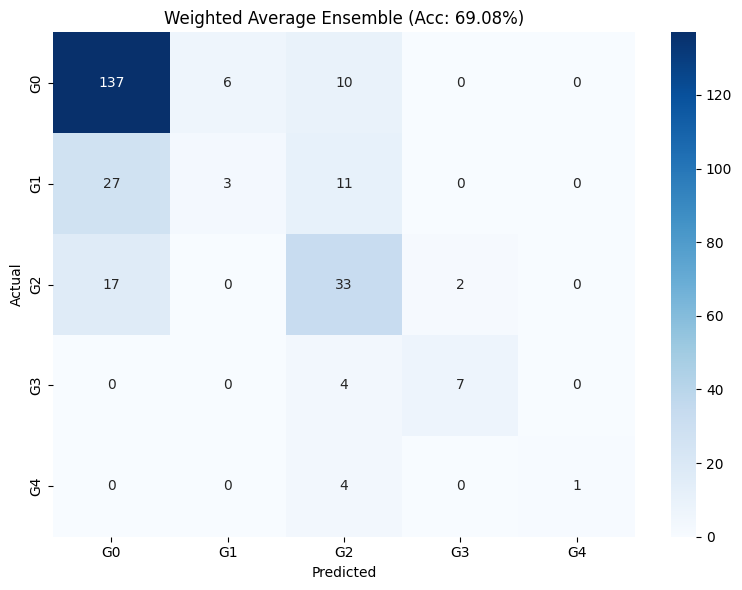

All results saved!


In [16]:
print(f"\nClassification Report (Weighted Average):")
print(classification_report(test_labels, bp, target_names=['Grade 0','Grade 1','Grade 2','Grade 3','Grade 4']))

crit = nn.CrossEntropyLoss()
print(f"{'='*55}\nALL MODELS ON TEST SET\n{'='*55}")
for name, (m2, mt, va) in trained_models.items():
    _, ta, _, _, _ = evaluate_model(m2, test_loader, crit, device, mt)
    print(f"  {name:20s} | Val: {va:.4f} | Test: {ta:.4f}")
print(f"  {bn:20s} | Val:   --  | Test: {ba:.4f}")

cm = confusion_matrix(test_labels, bp)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['G0','G1','G2','G3','G4'],
            yticklabels=['G0','G1','G2','G3','G4'])
plt.title(f'{bn} Ensemble (Acc: {ba:.2%})')
plt.xlabel('Predicted'); plt.ylabel('Actual')
plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/confusion_matrix.png', dpi=300)
plt.show()

if bn == 'XGBoost': joblib.dump(xgb_m, f"{MODELS_DIR}/meta_learner.pkl")
elif bn == 'Logistic Regression': joblib.dump(lr_m, f"{MODELS_DIR}/meta_learner.pkl")
print("All results saved!")

# GRAD-CAM

Found samples for grades: [0, 1, 2, 3, 4]


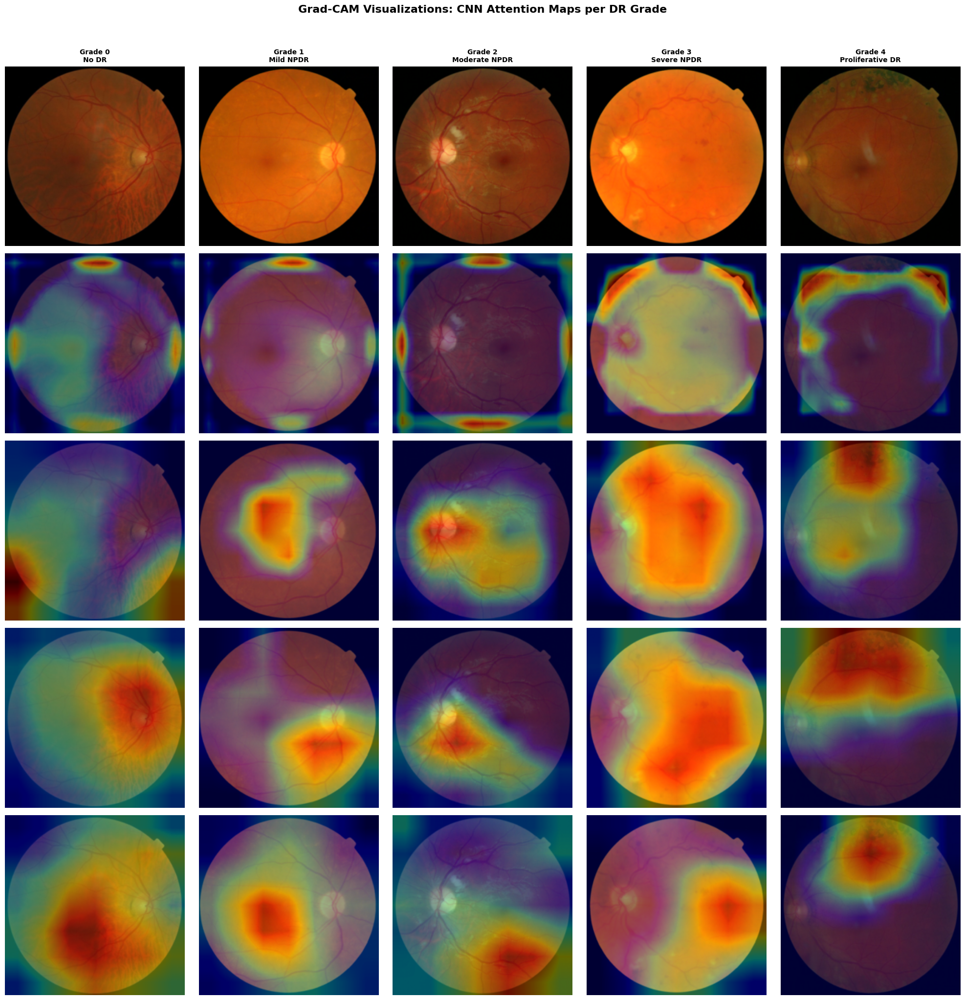

Grad-CAM saved to: /content/drive/My Drive/dr_project_copy/models/gradcam_all_models.png


In [17]:
# ============================================================================
# GRAD-CAM VISUALIZATIONS
# ============================================================================
import torch.nn.functional as F
import matplotlib.cm as cm

def get_gradcam(model, img_tensor, target_class, target_layer, model_type='image', meta_tensor=None):
    """Generate Grad-CAM heatmap for a given image and target class"""
    model.eval()

    # Storage for activations and gradients
    activations = []
    gradients = []

    def forward_hook(module, input, output):
        activations.append(output.detach())

    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach())

    # Register hooks
    fh = target_layer.register_forward_hook(forward_hook)
    bh = target_layer.register_full_backward_hook(backward_hook)

    # Forward pass
    img_tensor = img_tensor.unsqueeze(0).to(device).requires_grad_(True)
    if model_type == 'fusion':
        meta_tensor = meta_tensor.unsqueeze(0).to(device)
        output = model(img_tensor, meta_tensor)
    else:
        output = model(img_tensor)

    # Backward pass for target class
    model.zero_grad()
    output[0, target_class].backward()

    # Remove hooks
    fh.remove()
    bh.remove()

    # Compute Grad-CAM
    act = activations[0].squeeze()  # [C, H, W]
    grad = gradients[0].squeeze()   # [C, H, W]
    weights = grad.mean(dim=(1, 2))  # Global average pooling of gradients

    # Weighted combination
    heatmap = torch.zeros(act.shape[1:], device=device)
    for i, w in enumerate(weights):
        heatmap += w * act[i]

    heatmap = F.relu(heatmap)  # ReLU
    heatmap = heatmap.cpu().numpy()

    # Normalize to 0-1
    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()

    return heatmap

def overlay_heatmap(img, heatmap, alpha=0.4):
    """Overlay heatmap on original image"""
    import cv2
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_colored = cm.jet(heatmap_resized)[:, :, :3]  # RGB
    overlay = (1 - alpha) * img + alpha * heatmap_colored
    return np.clip(overlay, 0, 1)

def denormalize(tensor):
    """Convert normalized tensor back to displayable image"""
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    img = tensor.cpu().clone()
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return np.clip(img.permute(1, 2, 0).numpy(), 0, 1)

# Get target layers for each CNN model
def get_target_layer(model, model_name):
    if model_name == 'CustomCNN':
        # Last conv layer (Conv2d 256->512)
        return model.features[12]  # The Conv2d(256, 512) layer
    elif model_name == 'EfficientNet-B0':
        return model.backbone._blocks[-1]
    elif model_name == 'DenseNet121':
        return model.model.features.denseblock4
    elif model_name == 'ResNet50_Fusion':
        return model.backbone.layer4[-1]
    return None

# Select sample images (one per grade from test set)
grade_names = ['No DR', 'Mild NPDR', 'Moderate NPDR', 'Severe NPDR', 'Proliferative DR']
cnn_models = ['CustomCNN', 'EfficientNet-B0', 'DenseNet121', 'ResNet50_Fusion']

# Get one sample per grade from test set
test_dataset = test_loader.dataset
sample_indices = {}
for idx in range(len(test_dataset)):
    _, _, label = test_dataset[idx]
    grade = label.item()
    if grade not in sample_indices:
        sample_indices[grade] = idx
    if len(sample_indices) == 5:
        break

print(f"Found samples for grades: {sorted(sample_indices.keys())}")

# Generate Grad-CAM for each CNN model × each grade
fig, axes = plt.subplots(len(cnn_models) + 1, len(sample_indices), figsize=(4 * len(sample_indices), 4 * (len(cnn_models) + 1)))

for col, (grade, idx) in enumerate(sorted(sample_indices.items())):
    img_tensor, meta_tensor, label = test_dataset[idx]
    orig_img = denormalize(img_tensor)

    # Row 0: Original image
    axes[0, col].imshow(orig_img)
    axes[0, col].set_title(f'Grade {grade}\n{grade_names[grade]}', fontweight='bold', fontsize=10)
    axes[0, col].axis('off')
    if col == 0:
        axes[0, col].set_ylabel('Original', fontsize=12, fontweight='bold')

    # Rows 1-4: Grad-CAM for each CNN
    for row, model_name in enumerate(cnn_models):
        model_obj, mtype, _ = trained_models[model_name]
        target_layer = get_target_layer(model_obj, model_name)

        if target_layer is not None:
            try:
                if mtype == 'fusion':
                    heatmap = get_gradcam(model_obj, img_tensor, grade, target_layer, 'fusion', meta_tensor)
                else:
                    heatmap = get_gradcam(model_obj, img_tensor, grade, target_layer, 'image')
                overlay = overlay_heatmap(orig_img, heatmap)
                axes[row + 1, col].imshow(overlay)
            except Exception as e:
                axes[row + 1, col].imshow(orig_img)
                axes[row + 1, col].text(0.5, 0.5, f'Error', ha='center', va='center', transform=axes[row+1,col].transAxes)
        else:
            axes[row + 1, col].imshow(orig_img)

        axes[row + 1, col].axis('off')
        if col == 0:
            axes[row + 1, col].set_ylabel(model_name, fontsize=11, fontweight='bold')

plt.suptitle('Grad-CAM Visualizations: CNN Attention Maps per DR Grade', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/gradcam_all_models.png', dpi=300, bbox_inches='tight')
plt.show()
print(f"Grad-CAM saved to: {MODELS_DIR}/gradcam_all_models.png")

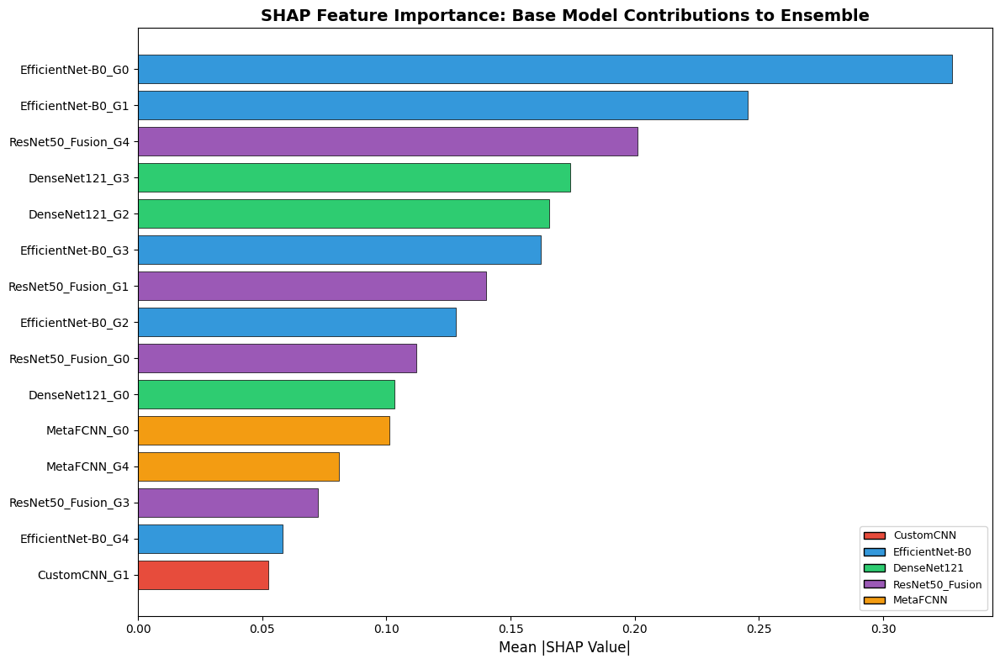

Plot 1 saved!

SHAP dot plot for Grade 0:


/tmp/ipykernel_11663/2701561166.py:56: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_grade0, X_test, feature_names=feature_names, show=False, max_display=15)


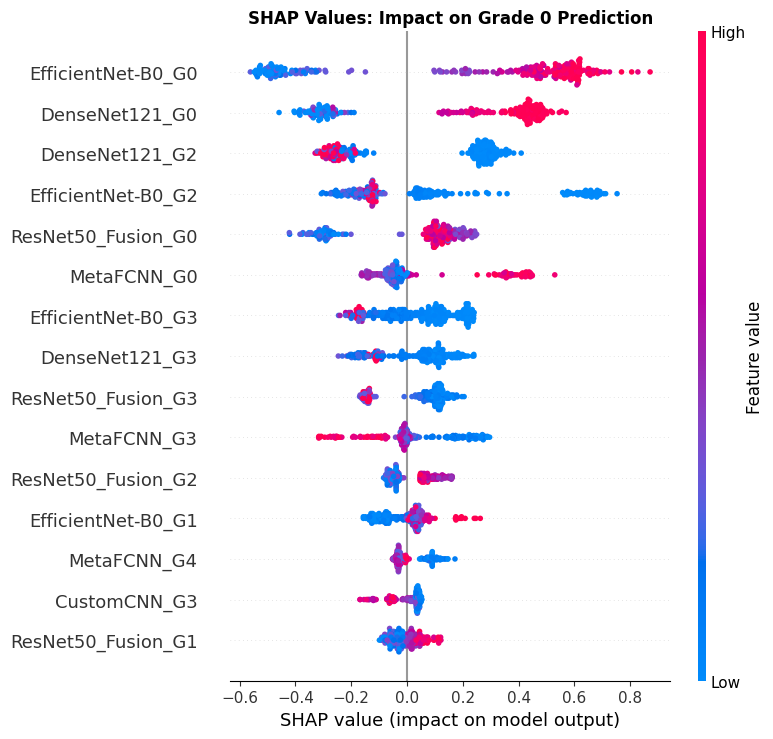

Plot 2 saved!


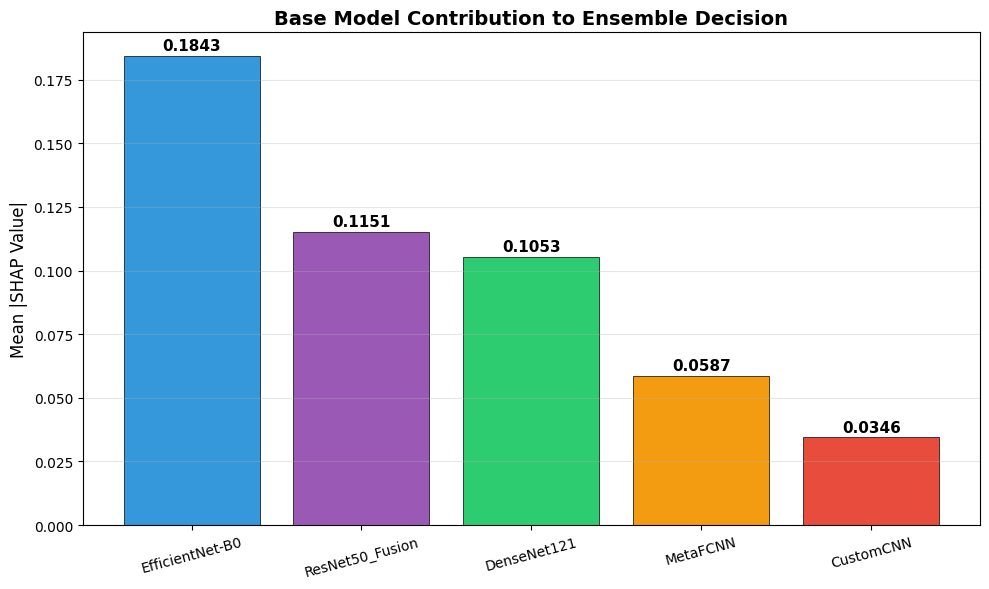


Model Contribution Ranking:
  EfficientNet-B0      | SHAP: 0.1843
  ResNet50_Fusion      | SHAP: 0.1151
  DenseNet121          | SHAP: 0.1053
  MetaFCNN             | SHAP: 0.0587
  CustomCNN            | SHAP: 0.0346

All SHAP plots saved to: /content/drive/My Drive/dr_project_copy/models/


In [19]:
# ============================================================================
# SHAP PLOTS (FIXED)
# ============================================================================

# Feature names
model_names_list = ['CustomCNN', 'EfficientNet-B0', 'DenseNet121', 'ResNet50_Fusion', 'MetaFCNN']
grade_labels = ['G0', 'G1', 'G2', 'G3', 'G4']
feature_names = []
for mn in model_names_list:
    for gl in grade_labels:
        feature_names.append(f'{mn}_{gl}')

# Compute mean SHAP (multi-class: shape is [262, 25, 5])
shap_abs = np.mean(np.abs(np.array(shap_values)), axis=2)  # Average across classes → [262, 25]
mean_shap = np.mean(shap_abs, axis=0)  # Average across samples → [25]

# Sort top 15
sorted_idx = list(np.argsort(mean_shap)[::-1][:15])

colors_map = {
    'CustomCNN': '#e74c3c',
    'EfficientNet-B0': '#3498db',
    'DenseNet121': '#2ecc71',
    'ResNet50_Fusion': '#9b59b6',
    'MetaFCNN': '#f39c12'
}

bar_colors = []
for i in sorted_idx:
    fn = feature_names[i]
    for mn in model_names_list:
        if fn.startswith(mn):
            bar_colors.append(colors_map[mn])
            break

# PLOT 1: Bar chart
plt.figure(figsize=(12, 8))
plt.barh(range(len(sorted_idx)), [mean_shap[i] for i in sorted_idx],
         color=bar_colors, edgecolor='black', linewidth=0.5)
plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx], fontsize=10)
plt.xlabel('Mean |SHAP Value|', fontsize=12)
plt.title('SHAP Feature Importance: Base Model Contributions to Ensemble', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()

from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=c, edgecolor='black', label=n) for n, c in colors_map.items()]
plt.legend(handles=legend_elements, loc='lower right', fontsize=9)
plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/shap_importance.png', dpi=300)
plt.show()
print("Plot 1 saved!")

# PLOT 2: SHAP dot plot for Grade 0
print("\nSHAP dot plot for Grade 0:")
shap_grade0 = np.array(shap_values)[:, :, 0]  # Shape [262, 25]
shap.summary_plot(shap_grade0, X_test, feature_names=feature_names, show=False, max_display=15)
plt.title('SHAP Values: Impact on Grade 0 Prediction', fontweight='bold')
plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/shap_dot_grade0.png', dpi=300)
plt.show()
print("Plot 2 saved!")

# PLOT 3: Per-model aggregated contribution
model_shap = {}
for mn in model_names_list:
    model_indices = [i for i, fn in enumerate(feature_names) if fn.startswith(mn)]
    model_contribution = np.mean(mean_shap[model_indices])
    model_shap[mn] = model_contribution

sorted_models = sorted(model_shap.items(), key=lambda x: x[1], reverse=True)
names_sorted = [x[0] for x in sorted_models]
values_sorted = [x[1] for x in sorted_models]
colors_sorted = [colors_map[n] for n in names_sorted]

fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(names_sorted, values_sorted, color=colors_sorted, edgecolor='black', linewidth=0.5)
for b, v in zip(bars, values_sorted):
    ax.text(b.get_x() + b.get_width()/2., b.get_height() + 0.001,
            f'{v:.4f}', ha='center', va='bottom', fontweight='bold', fontsize=11)
ax.set_ylabel('Mean |SHAP Value|', fontsize=12)
ax.set_title('Base Model Contribution to Ensemble Decision', fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3)
plt.xticks(rotation=15)
plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/shap_model_contribution.png', dpi=300)
plt.show()

print("\nModel Contribution Ranking:")
for name, val in sorted_models:
    print(f"  {name:20s} | SHAP: {val:.4f}")
print(f"\nAll SHAP plots saved to: {MODELS_DIR}/")

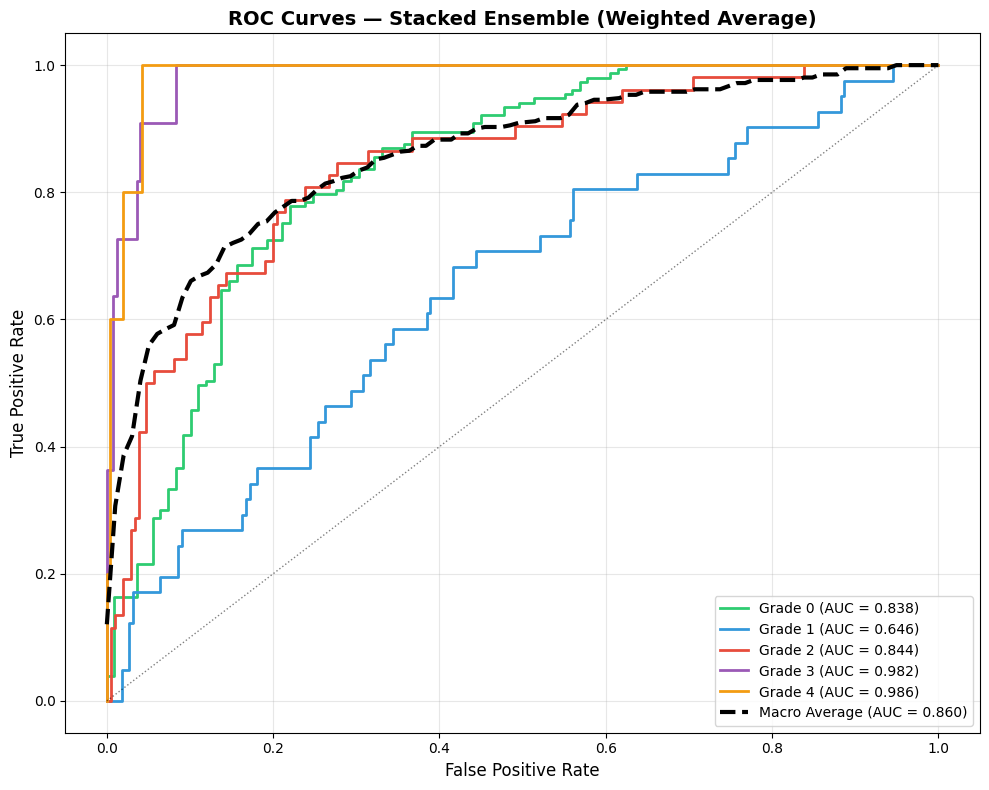

Ensemble AUC Scores:
  Grade 0         | AUC: 0.8380
  Grade 1         | AUC: 0.6458
  Grade 2         | AUC: 0.8440
  Grade 3         | AUC: 0.9823
  Grade 4         | AUC: 0.9860
  Macro Average   | AUC: 0.8595

Plot 1 saved!


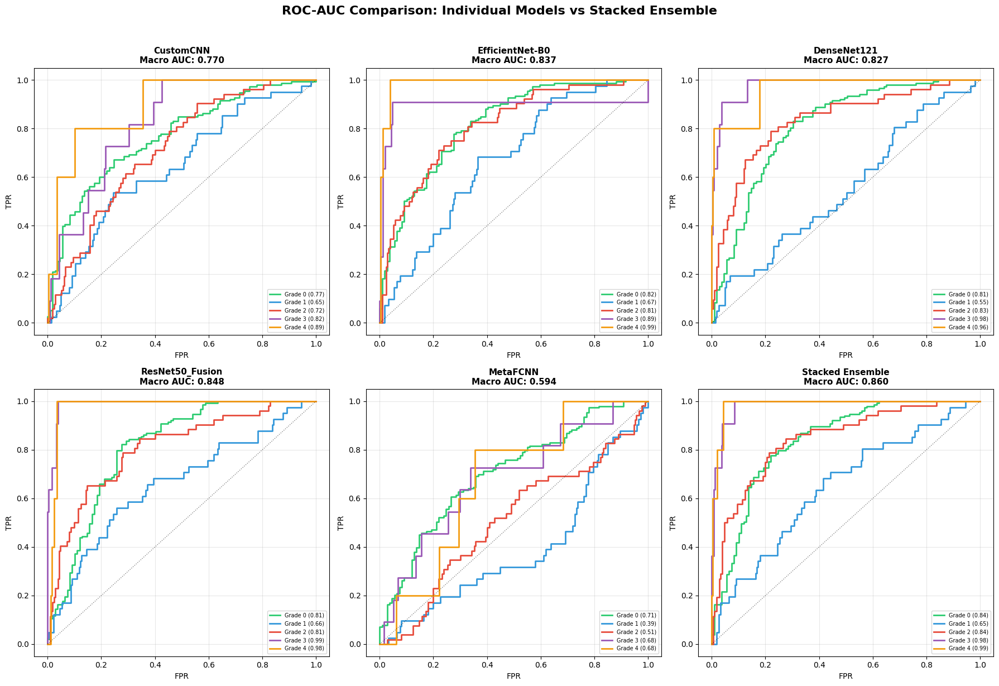


Macro AUC Comparison:
  CustomCNN            | Macro AUC: 0.7696
  EfficientNet-B0      | Macro AUC: 0.8372
  DenseNet121          | Macro AUC: 0.8274
  ResNet50_Fusion      | Macro AUC: 0.8484
  MetaFCNN             | Macro AUC: 0.5936
  Stacked Ensemble     | Macro AUC: 0.8595


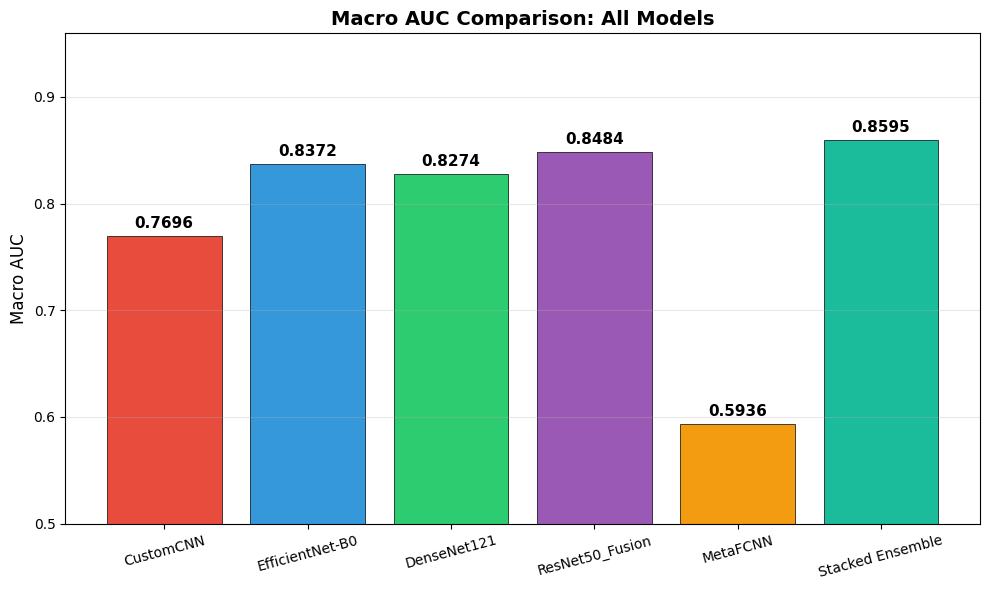


All ROC plots saved to: /content/drive/My Drive/dr_project_copy/models/


In [20]:
# ============================================================================
# ROC-AUC CURVES (One-vs-Rest for Multi-Class)
# ============================================================================
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize test labels for OvR
y_test_bin = label_binarize(test_labels, classes=[0, 1, 2, 3, 4])
grade_names = ['Grade 0', 'Grade 1', 'Grade 2', 'Grade 3', 'Grade 4']
colors = ['#2ecc71', '#3498db', '#e74c3c', '#9b59b6', '#f39c12']

# ---- PLOT 1: ROC for Best Ensemble (Weighted Average) ----
# Get ensemble probabilities
w = {'CustomCNN':0.05, 'EfficientNet-B0':0.25, 'DenseNet121':0.30, 'ResNet50_Fusion':0.30, 'MetaFCNN':0.10}
ensemble_probs = sum(w[n] * test_probs[n] for n in w)

fig, ax = plt.subplots(figsize=(10, 8))
auc_scores = {}

for i in range(5):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], ensemble_probs[:, i])
    roc_auc = auc(fpr, tpr)
    auc_scores[grade_names[i]] = roc_auc
    ax.plot(fpr, tpr, color=colors[i], lw=2, label=f'{grade_names[i]} (AUC = {roc_auc:.3f})')

# Macro average
all_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(all_fpr)
for i in range(5):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], ensemble_probs[:, i])
    mean_tpr += np.interp(all_fpr, fpr, tpr)
mean_tpr /= 5
macro_auc = auc(all_fpr, mean_tpr)
ax.plot(all_fpr, mean_tpr, color='black', lw=3, linestyle='--', label=f'Macro Average (AUC = {macro_auc:.3f})')

ax.plot([0, 1], [0, 1], 'k:', lw=1, alpha=0.5)
ax.set_xlabel('False Positive Rate', fontsize=12)
ax.set_ylabel('True Positive Rate', fontsize=12)
ax.set_title('ROC Curves — Stacked Ensemble (Weighted Average)', fontsize=14, fontweight='bold')
ax.legend(loc='lower right', fontsize=10)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/roc_ensemble.png', dpi=300)
plt.show()

print("Ensemble AUC Scores:")
for name, score in auc_scores.items():
    print(f"  {name:15s} | AUC: {score:.4f}")
print(f"  {'Macro Average':15s} | AUC: {macro_auc:.4f}")
print(f"\nPlot 1 saved!")

# ---- PLOT 2: ROC Comparison Across All Models ----
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Individual models
model_aucs = {}
for idx, (name, probs) in enumerate(test_probs.items()):
    ax = axes[idx]
    model_auc_list = []
    for i in range(5):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], probs[:, i])
        roc_auc = auc(fpr, tpr)
        model_auc_list.append(roc_auc)
        ax.plot(fpr, tpr, color=colors[i], lw=2, label=f'{grade_names[i]} ({roc_auc:.2f})')

    macro = np.mean(model_auc_list)
    model_aucs[name] = macro
    ax.plot([0, 1], [0, 1], 'k:', lw=1, alpha=0.5)
    ax.set_title(f'{name}\nMacro AUC: {macro:.3f}', fontweight='bold', fontsize=11)
    ax.legend(fontsize=7, loc='lower right')
    ax.grid(True, alpha=0.3)
    ax.set_xlabel('FPR'); ax.set_ylabel('TPR')

# Ensemble in last subplot
ax = axes[5]
for i in range(5):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], ensemble_probs[:, i])
    roc_auc = auc(fpr, tpr)
    ax.plot(fpr, tpr, color=colors[i], lw=2, label=f'{grade_names[i]} ({roc_auc:.2f})')
ax.plot([0, 1], [0, 1], 'k:', lw=1, alpha=0.5)
ax.set_title(f'Stacked Ensemble\nMacro AUC: {macro_auc:.3f}', fontweight='bold', fontsize=11)
ax.legend(fontsize=7, loc='lower right')
ax.grid(True, alpha=0.3)
ax.set_xlabel('FPR'); ax.set_ylabel('TPR')

plt.suptitle('ROC-AUC Comparison: Individual Models vs Stacked Ensemble', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/roc_all_models.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nMacro AUC Comparison:")
for name, macro in model_aucs.items():
    print(f"  {name:20s} | Macro AUC: {macro:.4f}")
print(f"  {'Stacked Ensemble':20s} | Macro AUC: {macro_auc:.4f}")

# ---- PLOT 3: AUC Bar Chart ----
all_names = list(model_aucs.keys()) + ['Stacked Ensemble']
all_aucs = list(model_aucs.values()) + [macro_auc]
bar_colors = ['#e74c3c', '#3498db', '#2ecc71', '#9b59b6', '#f39c12', '#1abc9c']

fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(all_names, all_aucs, color=bar_colors, edgecolor='black', linewidth=0.5)
for b, a in zip(bars, all_aucs):
    ax.text(b.get_x() + b.get_width()/2., b.get_height() + 0.005,
            f'{a:.4f}', ha='center', va='bottom', fontweight='bold', fontsize=11)
ax.set_ylabel('Macro AUC', fontsize=12)
ax.set_title('Macro AUC Comparison: All Models', fontsize=14, fontweight='bold')
ax.set_ylim(0.5, max(all_aucs) + 0.1)
ax.grid(axis='y', alpha=0.3)
plt.xticks(rotation=15)
plt.tight_layout()
plt.savefig(f'{MODELS_DIR}/auc_comparison.png', dpi=300)
plt.show()

print(f"\nAll ROC plots saved to: {MODELS_DIR}/")

DEMO: Classifying Test Image #0
True Label: Grade 2 (Moderate NPDR)

  CustomCNN            → Grade 0 (No DR) | Conf: 79.1% ✗
  EfficientNet-B0      → Grade 0 (No DR) | Conf: 44.1% ✗
  DenseNet121          → Grade 0 (No DR) | Conf: 66.0% ✗
  ResNet50_Fusion      → Grade 0 (No DR) | Conf: 48.8% ✗
  MetaFCNN             → Grade 0 (No DR) | Conf: 45.6% ✗

  ENSEMBLE             → Grade 0 (No DR) | Conf: 54.0% ✗


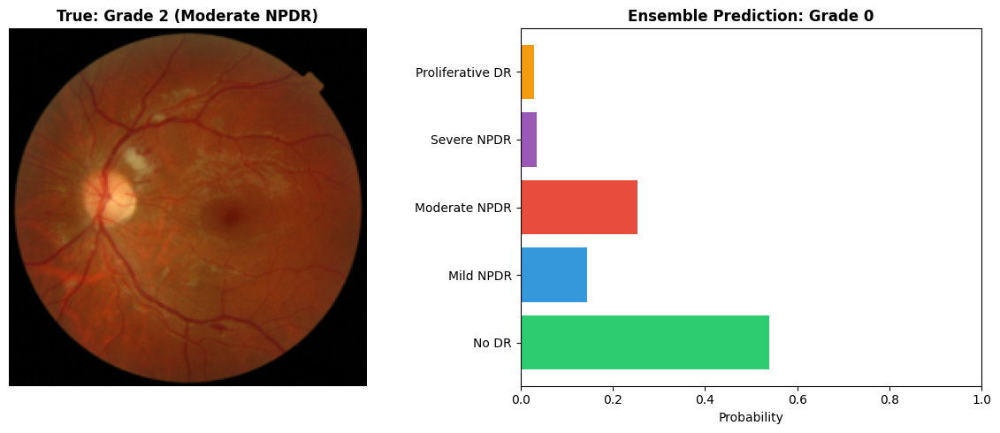


DEMO: Classifying Test Image #50
True Label: Grade 0 (No DR)

  CustomCNN            → Grade 0 (No DR) | Conf: 67.4% ✓
  EfficientNet-B0      → Grade 0 (No DR) | Conf: 87.3% ✓
  DenseNet121          → Grade 0 (No DR) | Conf: 96.8% ✓
  ResNet50_Fusion      → Grade 0 (No DR) | Conf: 76.1% ✓
  MetaFCNN             → Grade 0 (No DR) | Conf: 29.6% ✓

  ENSEMBLE             → Grade 0 (No DR) | Conf: 80.0% ✓


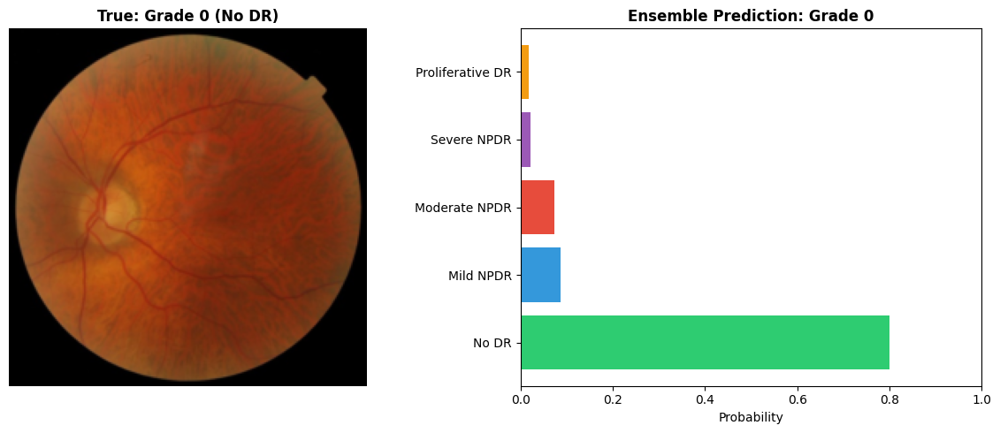


DEMO: Classifying Test Image #100
True Label: Grade 1 (Mild NPDR)

  CustomCNN            → Grade 1 (Mild NPDR) | Conf: 32.6% ✓
  EfficientNet-B0      → Grade 2 (Moderate NPDR) | Conf: 70.1% ✗
  DenseNet121          → Grade 2 (Moderate NPDR) | Conf: 91.1% ✗
  ResNet50_Fusion      → Grade 2 (Moderate NPDR) | Conf: 40.8% ✗
  MetaFCNN             → Grade 0 (No DR) | Conf: 26.8% ✗

  ENSEMBLE             → Grade 2 (Moderate NPDR) | Conf: 61.0% ✗


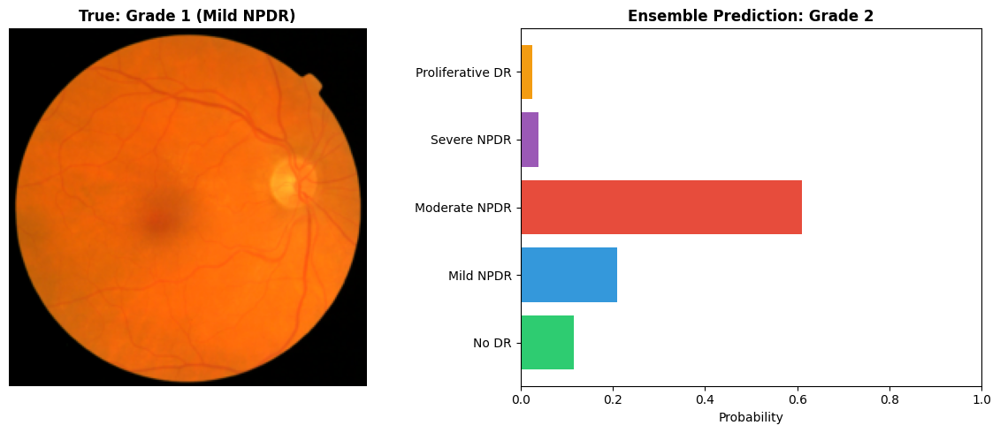


DEMO: Classifying Test Image #150
True Label: Grade 0 (No DR)

  CustomCNN            → Grade 0 (No DR) | Conf: 43.4% ✓
  EfficientNet-B0      → Grade 0 (No DR) | Conf: 66.5% ✓
  DenseNet121          → Grade 0 (No DR) | Conf: 95.4% ✓
  ResNet50_Fusion      → Grade 0 (No DR) | Conf: 47.4% ✓
  MetaFCNN             → Grade 3 (Severe NPDR) | Conf: 27.2% ✗

  ENSEMBLE             → Grade 0 (No DR) | Conf: 63.5% ✓


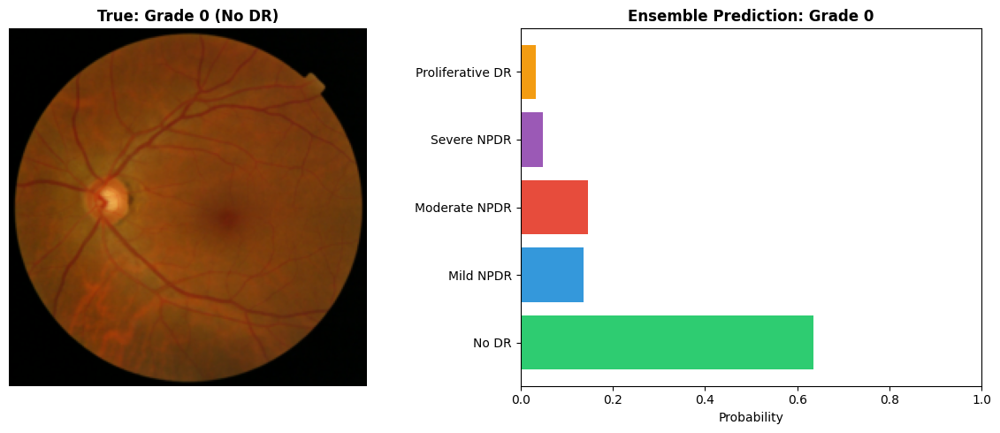


DEMO: Classifying Test Image #200
True Label: Grade 0 (No DR)

  CustomCNN            → Grade 0 (No DR) | Conf: 93.8% ✓
  EfficientNet-B0      → Grade 0 (No DR) | Conf: 91.2% ✓
  DenseNet121          → Grade 0 (No DR) | Conf: 97.8% ✓
  ResNet50_Fusion      → Grade 0 (No DR) | Conf: 81.7% ✓
  MetaFCNN             → Grade 0 (No DR) | Conf: 26.4% ✓

  ENSEMBLE             → Grade 0 (No DR) | Conf: 84.0% ✓


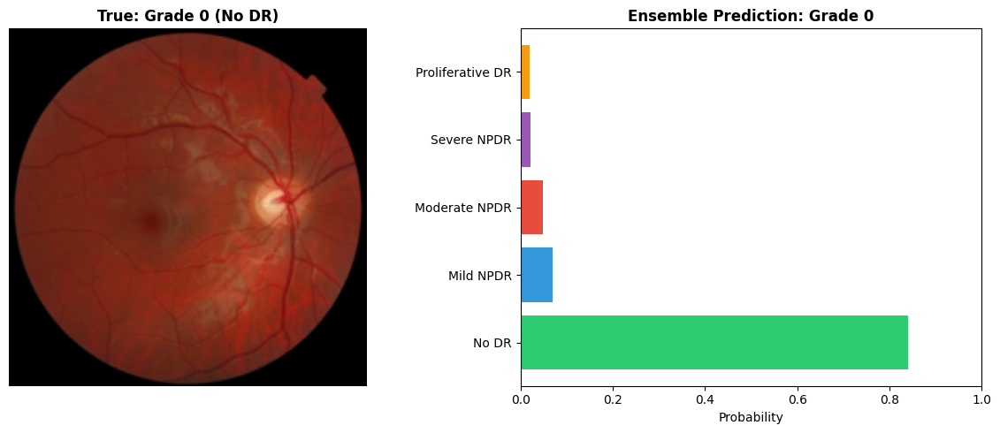

In [21]:
# ============================================================================
# SIMPLE DEMO: Classify a Single Retinal Image
# ============================================================================
def demo_classify(image_index=0):
    """Classify a test image and show all model predictions"""
    img_tensor, meta_tensor, true_label = test_loader.dataset[image_index]
    grade_names = ['No DR', 'Mild NPDR', 'Moderate NPDR', 'Severe NPDR', 'Proliferative DR']

    # Get predictions from all models
    print(f"{'='*55}")
    print(f"DEMO: Classifying Test Image #{image_index}")
    print(f"True Label: Grade {true_label.item()} ({grade_names[true_label.item()]})")
    print(f"{'='*55}\n")

    all_probs = {}
    for name, (model, mtype, _) in trained_models.items():
        model.eval()
        with torch.no_grad():
            if mtype == 'metadata':
                out = model(meta_tensor.unsqueeze(0).to(device))
            elif mtype == 'fusion':
                out = model(img_tensor.unsqueeze(0).to(device), meta_tensor.unsqueeze(0).to(device))
            else:
                out = model(img_tensor.unsqueeze(0).to(device))
            probs = torch.softmax(out, 1).cpu().numpy()[0]
            all_probs[name] = probs
            pred = np.argmax(probs)
            conf = probs[pred] * 100
            status = "✓" if pred == true_label.item() else "✗"
            print(f"  {name:20s} → Grade {pred} ({grade_names[pred]}) | Conf: {conf:.1f}% {status}")

    # Ensemble prediction
    w = {'CustomCNN':0.05, 'EfficientNet-B0':0.25, 'DenseNet121':0.30, 'ResNet50_Fusion':0.30, 'MetaFCNN':0.10}
    ens_probs = sum(w[n] * all_probs[n] for n in w)
    ens_pred = np.argmax(ens_probs)
    ens_conf = ens_probs[ens_pred] * 100
    status = "✓" if ens_pred == true_label.item() else "✗"
    print(f"\n  {'ENSEMBLE':20s} → Grade {ens_pred} ({grade_names[ens_pred]}) | Conf: {ens_conf:.1f}% {status}")

    # Show image with prediction
    orig_img = denormalize(img_tensor)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(orig_img)
    axes[0].set_title(f'True: Grade {true_label.item()} ({grade_names[true_label.item()]})', fontweight='bold')
    axes[0].axis('off')

    axes[1].barh(grade_names, ens_probs, color=['#2ecc71','#3498db','#e74c3c','#9b59b6','#f39c12'])
    axes[1].set_xlabel('Probability')
    axes[1].set_title(f'Ensemble Prediction: Grade {ens_pred}', fontweight='bold')
    axes[1].set_xlim(0, 1)
    plt.tight_layout()
    plt.show()

# Run demo for 5 different images
for i in [0, 50, 100, 150, 200]:
    demo_classify(i)
    print()

Upload a retinal fundus image...


Saving images.jpeg to images.jpeg

  DIABETIC RETINOPATHY CLASSIFICATION SYSTEM
  Image: images.jpeg

  CustomCNN            → Severe NPDR (Grade 3)          | Confidence: 53.2%
  EfficientNet-B0      → Severe NPDR (Grade 3)          | Confidence: 43.3%
  DenseNet121          → Proliferative DR (Grade 4)     | Confidence: 53.9%
  ResNet50_Fusion      → Moderate NPDR (Grade 2)        | Confidence: 31.2%
  MetaFCNN             → No DR (Grade 0)                | Confidence: 24.7%

  ───────────────────────────────────────────────────────
  ENSEMBLE PREDICTION  → Proliferative DR (Grade 4)     | Confidence: 31.9%
  ───────────────────────────────────────────────────────


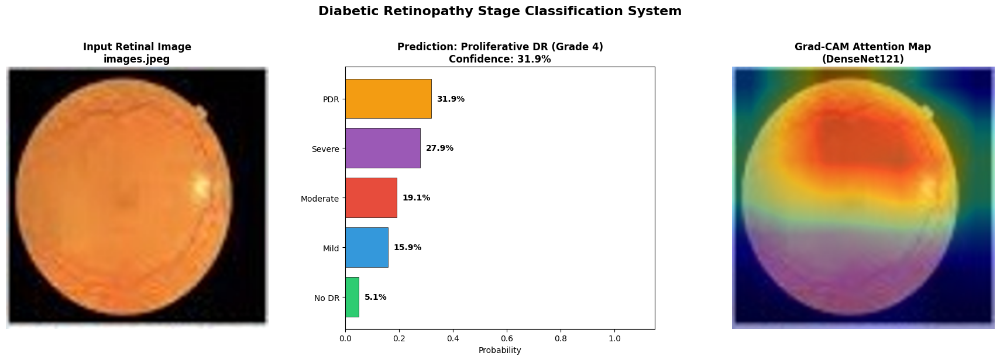


  CLINICAL RECOMMENDATION:
  Proliferative DR detected. EMERGENCY — Immediate ophthalmology referral required.

  Note: This is an AI-assisted screening tool. Final diagnosis
  must be confirmed by a qualified ophthalmologist.


In [25]:
# ============================================================================
# DEMO: Upload Any Retinal Image and Predict DR Grade
# ============================================================================
from google.colab import files
import io

grade_names = ['No DR (Grade 0)', 'Mild NPDR (Grade 1)', 'Moderate NPDR (Grade 2)',
               'Severe NPDR (Grade 3)', 'Proliferative DR (Grade 4)']
grade_colors = ['#2ecc71', '#3498db', '#e74c3c', '#9b59b6', '#f39c12']

def predict_retinal_image():
    # Step 1: Upload image
    print("Upload a retinal fundus image...")
    uploaded = files.upload()

    if not uploaded:
        print("No file uploaded!")
        return

    filename = list(uploaded.keys())[0]
    img = Image.open(io.BytesIO(uploaded[filename])).convert('RGB')

    # Step 2: Preprocess
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    img_tensor = transform(img).unsqueeze(0).to(device)

    # Dummy metadata (since we don't have real patient data)
    dummy_meta = torch.zeros(1, 4).to(device)

    # Step 3: Get predictions from all models
    print(f"\n{'='*60}")
    print(f"  DIABETIC RETINOPATHY CLASSIFICATION SYSTEM")
    print(f"  Image: {filename}")
    print(f"{'='*60}\n")

    all_probs = {}
    for name, (model, mtype, _) in trained_models.items():
        model.eval()
        with torch.no_grad():
            if mtype == 'metadata':
                out = model(dummy_meta)
            elif mtype == 'fusion':
                out = model(img_tensor, dummy_meta)
            else:
                out = model(img_tensor)
            probs = torch.softmax(out, 1).cpu().numpy()[0]
            all_probs[name] = probs
            pred = np.argmax(probs)
            conf = probs[pred] * 100
            print(f"  {name:20s} → {grade_names[pred]:30s} | Confidence: {conf:.1f}%")

    # Step 4: Ensemble prediction
    w = {'CustomCNN':0.05, 'EfficientNet-B0':0.25, 'DenseNet121':0.30,
         'ResNet50_Fusion':0.30, 'MetaFCNN':0.10}
    ens_probs = sum(w[n] * all_probs[n] for n in w)
    ens_pred = np.argmax(ens_probs)
    ens_conf = ens_probs[ens_pred] * 100

    print(f"\n  {'─'*55}")
    print(f"  {'ENSEMBLE PREDICTION':20s} → {grade_names[ens_pred]:30s} | Confidence: {ens_conf:.1f}%")
    print(f"  {'─'*55}")

    # Step 5: Visualize results
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Original image
    axes[0].imshow(img.resize((224, 224)))
    axes[0].set_title(f'Input Retinal Image\n{filename}', fontweight='bold', fontsize=12)
    axes[0].axis('off')

    # Ensemble probability bar chart
    short_names = ['No DR', 'Mild', 'Moderate', 'Severe', 'PDR']
    bars = axes[1].barh(short_names, ens_probs, color=grade_colors, edgecolor='black', linewidth=0.5)
    for bar, prob in zip(bars, ens_probs):
        axes[1].text(bar.get_width() + 0.02, bar.get_y() + bar.get_height()/2,
                     f'{prob:.1%}', va='center', fontweight='bold')
    axes[1].set_xlabel('Probability')
    axes[1].set_title(f'Prediction: {grade_names[ens_pred]}\nConfidence: {ens_conf:.1f}%',
                      fontweight='bold', fontsize=12)
    axes[1].set_xlim(0, 1.15)

    # Grad-CAM overlay (using DenseNet121 — best individual model)
    try:
        model_dn, _, _ = trained_models['DenseNet121']
        target_layer = model_dn.model.features.denseblock4
        heatmap = get_gradcam(model_dn, transform(img), ens_pred, target_layer, 'image')
        orig_np = np.array(img.resize((224, 224))) / 255.0
        overlay = overlay_heatmap(orig_np, heatmap)
        axes[2].imshow(overlay)
        axes[2].set_title('Grad-CAM Attention Map\n(DenseNet121)', fontweight='bold', fontsize=12)
    except Exception as e:
        axes[2].imshow(img.resize((224, 224)))
        axes[2].set_title('Grad-CAM unavailable', fontweight='bold')
    axes[2].axis('off')

    plt.suptitle('Diabetic Retinopathy Stage Classification System', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(f'{MODELS_DIR}/demo_prediction.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Clinical recommendation
    recommendations = {
        0: "No signs of diabetic retinopathy detected. Recommend routine annual screening.",
        1: "Mild NPDR detected. Recommend follow-up in 9-12 months. Monitor blood sugar levels.",
        2: "Moderate NPDR detected. Recommend ophthalmology referral within 3-6 months.",
        3: "Severe NPDR detected. URGENT — Refer to ophthalmologist within 1 month.",
        4: "Proliferative DR detected. EMERGENCY — Immediate ophthalmology referral required."
    }
    print(f"\n  CLINICAL RECOMMENDATION:")
    print(f"  {recommendations[ens_pred]}")
    print(f"\n  Note: This is an AI-assisted screening tool. Final diagnosis")
    print(f"  must be confirmed by a qualified ophthalmologist.")

# Run the demo
predict_retinal_image()


  Image: Test #2 | True Label: Grade 0 (No DR)
  CustomCNN            → Grade 0 (No DR               ) | Conf: 77.9% ✓
  EfficientNet-B0      → Grade 0 (No DR               ) | Conf: 93.1% ✓
  DenseNet121          → Grade 0 (No DR               ) | Conf: 98.3% ✓
  ResNet50_Fusion      → Grade 0 (No DR               ) | Conf: 82.4% ✓
  MetaFCNN             → Grade 3 (Severe NPDR         ) | Conf: 31.7% ✗

  ENSEMBLE             → Grade 0 (No DR               ) | Conf: 83.2% ✓ CORRECT
  Recommendation: No DR detected. Routine annual screening recommended.


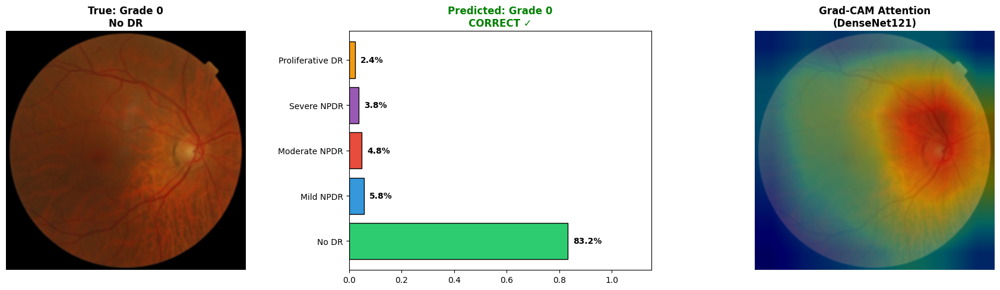


  Image: Test #3 | True Label: Grade 0 (No DR)
  CustomCNN            → Grade 0 (No DR               ) | Conf: 83.8% ✓
  EfficientNet-B0      → Grade 0 (No DR               ) | Conf: 94.7% ✓
  DenseNet121          → Grade 0 (No DR               ) | Conf: 95.6% ✓
  ResNet50_Fusion      → Grade 0 (No DR               ) | Conf: 84.3% ✓
  MetaFCNN             → Grade 0 (No DR               ) | Conf: 33.6% ✓

  ENSEMBLE             → Grade 0 (No DR               ) | Conf: 85.2% ✓ CORRECT
  Recommendation: No DR detected. Routine annual screening recommended.


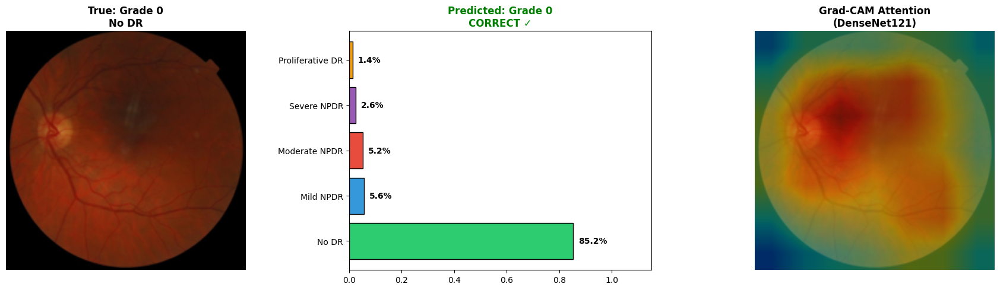


  Image: Test #1 | True Label: Grade 1 (Mild NPDR)
  CustomCNN            → Grade 2 (Moderate NPDR       ) | Conf: 29.2% ✗
  EfficientNet-B0      → Grade 2 (Moderate NPDR       ) | Conf: 57.4% ✗
  DenseNet121          → Grade 1 (Mild NPDR           ) | Conf: 59.4% ✓
  ResNet50_Fusion      → Grade 2 (Moderate NPDR       ) | Conf: 38.3% ✗
  MetaFCNN             → Grade 0 (No DR               ) | Conf: 29.6% ✗

  ENSEMBLE             → Grade 1 (Mild NPDR           ) | Conf: 34.7% ✓ CORRECT
  Recommendation: Mild NPDR. Follow-up in 9-12 months.


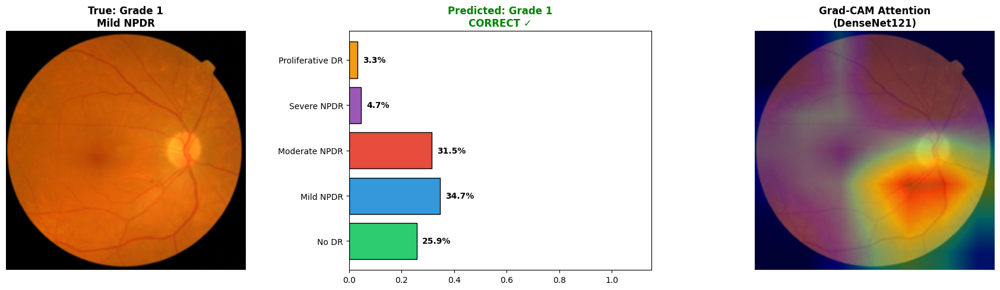


  Image: Test #11 | True Label: Grade 1 (Mild NPDR)
  CustomCNN            → Grade 0 (No DR               ) | Conf: 59.9% ✗
  EfficientNet-B0      → Grade 0 (No DR               ) | Conf: 95.1% ✗
  DenseNet121          → Grade 0 (No DR               ) | Conf: 97.6% ✗
  ResNet50_Fusion      → Grade 0 (No DR               ) | Conf: 90.0% ✗
  MetaFCNN             → Grade 0 (No DR               ) | Conf: 25.4% ✗

  ENSEMBLE             → Grade 0 (No DR               ) | Conf: 85.6% ✗ WRONG
  Recommendation: No DR detected. Routine annual screening recommended.


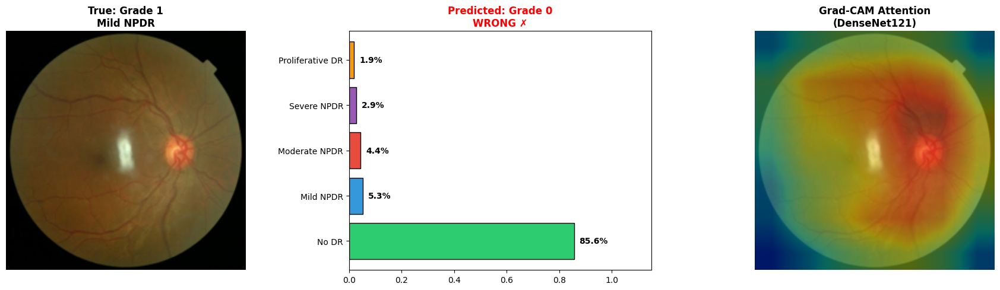


  Image: Test #0 | True Label: Grade 2 (Moderate NPDR)
  CustomCNN            → Grade 0 (No DR               ) | Conf: 79.1% ✗
  EfficientNet-B0      → Grade 0 (No DR               ) | Conf: 44.1% ✗
  DenseNet121          → Grade 0 (No DR               ) | Conf: 66.0% ✗
  ResNet50_Fusion      → Grade 0 (No DR               ) | Conf: 48.8% ✗
  MetaFCNN             → Grade 0 (No DR               ) | Conf: 45.6% ✗

  ENSEMBLE             → Grade 0 (No DR               ) | Conf: 54.0% ✗ WRONG
  Recommendation: No DR detected. Routine annual screening recommended.


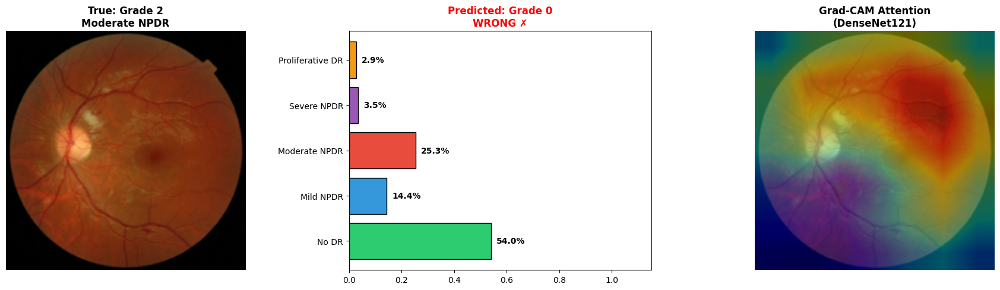


  Image: Test #7 | True Label: Grade 2 (Moderate NPDR)
  CustomCNN            → Grade 0 (No DR               ) | Conf: 80.3% ✗
  EfficientNet-B0      → Grade 0 (No DR               ) | Conf: 76.8% ✗
  DenseNet121          → Grade 0 (No DR               ) | Conf: 96.7% ✗
  ResNet50_Fusion      → Grade 0 (No DR               ) | Conf: 77.8% ✗
  MetaFCNN             → Grade 0 (No DR               ) | Conf: 23.1% ✗

  ENSEMBLE             → Grade 0 (No DR               ) | Conf: 77.9% ✗ WRONG
  Recommendation: No DR detected. Routine annual screening recommended.


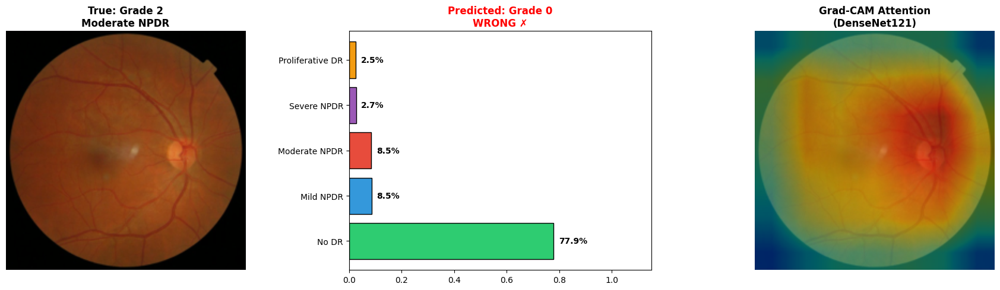


  Image: Test #16 | True Label: Grade 3 (Severe NPDR)
  CustomCNN            → Grade 1 (Mild NPDR           ) | Conf: 30.0% ✗
  EfficientNet-B0      → Grade 3 (Severe NPDR         ) | Conf: 82.8% ✓
  DenseNet121          → Grade 3 (Severe NPDR         ) | Conf: 98.3% ✓
  ResNet50_Fusion      → Grade 3 (Severe NPDR         ) | Conf: 80.4% ✓
  MetaFCNN             → Grade 0 (No DR               ) | Conf: 28.4% ✗

  ENSEMBLE             → Grade 3 (Severe NPDR         ) | Conf: 76.8% ✓ CORRECT
  Recommendation: Severe NPDR. URGENT — Refer within 1 month.


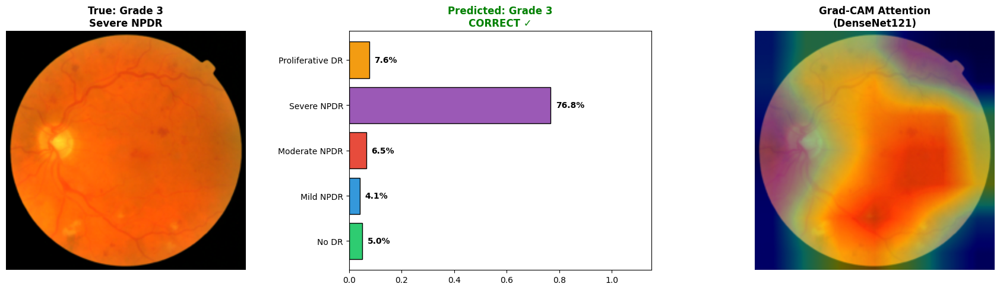


  Image: Test #140 | True Label: Grade 3 (Severe NPDR)
  CustomCNN            → Grade 0 (No DR               ) | Conf: 32.6% ✗
  EfficientNet-B0      → Grade 4 (Proliferative DR    ) | Conf: 86.9% ✗
  DenseNet121          → Grade 3 (Severe NPDR         ) | Conf: 92.7% ✓
  ResNet50_Fusion      → Grade 4 (Proliferative DR    ) | Conf: 43.4% ✗
  MetaFCNN             → Grade 3 (Severe NPDR         ) | Conf: 26.7% ✓

  ENSEMBLE             → Grade 3 (Severe NPDR         ) | Conf: 42.6% ✓ CORRECT
  Recommendation: Severe NPDR. URGENT — Refer within 1 month.


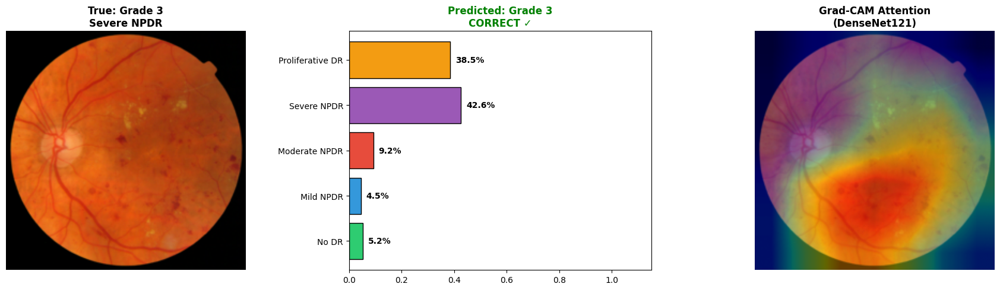


  Image: Test #14 | True Label: Grade 4 (Proliferative DR)
  CustomCNN            → Grade 0 (No DR               ) | Conf: 63.8% ✗
  EfficientNet-B0      → Grade 4 (Proliferative DR    ) | Conf: 77.8% ✓
  DenseNet121          → Grade 4 (Proliferative DR    ) | Conf: 75.3% ✓
  ResNet50_Fusion      → Grade 0 (No DR               ) | Conf: 37.8% ✗
  MetaFCNN             → Grade 3 (Severe NPDR         ) | Conf: 30.8% ✗

  ENSEMBLE             → Grade 4 (Proliferative DR    ) | Conf: 50.2% ✓ CORRECT
  Recommendation: Proliferative DR. EMERGENCY — Immediate referral.


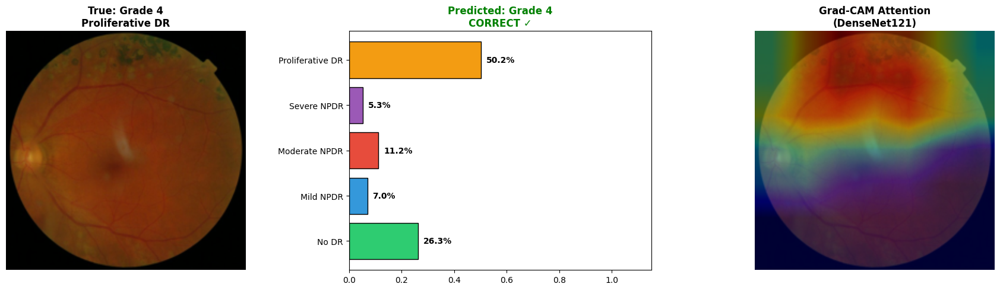


  Image: Test #34 | True Label: Grade 4 (Proliferative DR)
  CustomCNN            → Grade 2 (Moderate NPDR       ) | Conf: 29.9% ✗
  EfficientNet-B0      → Grade 4 (Proliferative DR    ) | Conf: 75.2% ✓
  DenseNet121          → Grade 2 (Moderate NPDR       ) | Conf: 83.4% ✗
  ResNet50_Fusion      → Grade 2 (Moderate NPDR       ) | Conf: 35.1% ✗
  MetaFCNN             → Grade 3 (Severe NPDR         ) | Conf: 47.7% ✗

  ENSEMBLE             → Grade 2 (Moderate NPDR       ) | Conf: 42.0% ✗ WRONG
  Recommendation: Moderate NPDR. Ophthalmology referral within 3-6 months.


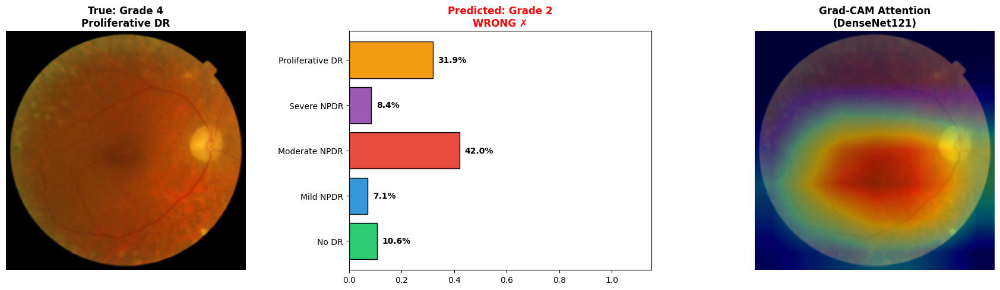


  DEMO SUMMARY: 6/10 correct (60.0%)


In [26]:
# ============================================================================
# OFFICIAL DEMO: Test Set Predictions (Correct Scientific Approach)
# ============================================================================
grade_names = ['No DR', 'Mild NPDR', 'Moderate NPDR', 'Severe NPDR', 'Proliferative DR']
grade_colors = ['#2ecc71', '#3498db', '#e74c3c', '#9b59b6', '#f39c12']

recommendations = {
    0: "No DR detected. Routine annual screening recommended.",
    1: "Mild NPDR. Follow-up in 9-12 months.",
    2: "Moderate NPDR. Ophthalmology referral within 3-6 months.",
    3: "Severe NPDR. URGENT — Refer within 1 month.",
    4: "Proliferative DR. EMERGENCY — Immediate referral."
}

# Get 2 samples per grade from test set
test_dataset = test_loader.dataset
grade_samples = {0:[], 1:[], 2:[], 3:[], 4:[]}
for idx in range(len(test_dataset)):
    _, _, label = test_dataset[idx]
    g = label.item()
    if len(grade_samples[g]) < 2:
        grade_samples[g].append(idx)

# Classify each sample
total_correct = 0
total_samples = 0

for grade in range(5):
    for sample_num, idx in enumerate(grade_samples[grade]):
        img_tensor, meta_tensor, true_label = test_dataset[idx]

        # All model predictions
        all_probs = {}
        print(f"\n{'='*60}")
        print(f"  Image: Test #{idx} | True Label: Grade {grade} ({grade_names[grade]})")
        print(f"{'='*60}")

        for name, (model, mtype, _) in trained_models.items():
            model.eval()
            with torch.no_grad():
                if mtype == 'metadata':
                    out = model(meta_tensor.unsqueeze(0).to(device))
                elif mtype == 'fusion':
                    out = model(img_tensor.unsqueeze(0).to(device), meta_tensor.unsqueeze(0).to(device))
                else:
                    out = model(img_tensor.unsqueeze(0).to(device))
                probs = torch.softmax(out, 1).cpu().numpy()[0]
                all_probs[name] = probs
                pred = np.argmax(probs)
                mark = "✓" if pred == grade else "✗"
                print(f"  {name:20s} → Grade {pred} ({grade_names[pred]:20s}) | Conf: {probs[pred]*100:.1f}% {mark}")

        # Ensemble
        w = {'CustomCNN':0.05, 'EfficientNet-B0':0.25, 'DenseNet121':0.30,
             'ResNet50_Fusion':0.30, 'MetaFCNN':0.10}
        ens_probs = sum(w[n] * all_probs[n] for n in w)
        ens_pred = np.argmax(ens_probs)
        ens_conf = ens_probs[ens_pred] * 100
        correct = ens_pred == grade
        total_correct += int(correct)
        total_samples += 1

        print(f"\n  {'ENSEMBLE':20s} → Grade {ens_pred} ({grade_names[ens_pred]:20s}) | Conf: {ens_conf:.1f}% {'✓ CORRECT' if correct else '✗ WRONG'}")
        print(f"  Recommendation: {recommendations[ens_pred]}")

        # Visualize
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))

        # Original
        orig_img = denormalize(img_tensor)
        axes[0].imshow(orig_img)
        axes[0].set_title(f'True: Grade {grade}\n{grade_names[grade]}', fontweight='bold', fontsize=12)
        axes[0].axis('off')

        # Probabilities
        bars = axes[1].barh(grade_names, ens_probs, color=grade_colors, edgecolor='black')
        for bar, prob in zip(bars, ens_probs):
            axes[1].text(bar.get_width() + 0.02, bar.get_y() + bar.get_height()/2,
                         f'{prob:.1%}', va='center', fontweight='bold')
        axes[1].set_xlim(0, 1.15)
        color = 'green' if correct else 'red'
        axes[1].set_title(f'Predicted: Grade {ens_pred}\n{"CORRECT ✓" if correct else "WRONG ✗"}',
                          fontweight='bold', fontsize=12, color=color)

        # Grad-CAM
        try:
            model_dn, _, _ = trained_models['DenseNet121']
            target_layer = model_dn.model.features.denseblock4
            heatmap = get_gradcam(model_dn, img_tensor, ens_pred, target_layer, 'image')
            overlay = overlay_heatmap(orig_img, heatmap)
            axes[2].imshow(overlay)
            axes[2].set_title('Grad-CAM Attention\n(DenseNet121)', fontweight='bold', fontsize=12)
        except:
            axes[2].imshow(orig_img)
            axes[2].set_title('Grad-CAM', fontweight='bold')
        axes[2].axis('off')

        plt.tight_layout()
        plt.savefig(f'{MODELS_DIR}/demo_g{grade}_s{sample_num}.png', dpi=300, bbox_inches='tight')
        plt.show()

print(f"\n{'='*60}")
print(f"  DEMO SUMMARY: {total_correct}/{total_samples} correct ({total_correct/total_samples*100:.1f}%)")
print(f"{'='*60}")